<a href="https://colab.research.google.com/github/JrrJrrJrr/MAI3002_Framingham/blob/main/GroupProject_MAI3002_Group6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **MAI3002 - Group 6**
# Cleo Habets - i6337758
# Jerrica Pubben - i6276134
# Noura al Sayed - i6359287

# **Introduction**

## **Research questions**

Research question:

'Can changes in pulse pressure between Visit 1 and Visit 2 predict the occurrence of a CVD event before Visit 3 in Framingham participants?'

Subquestions:

- Is the association between ΔPP and CVD different for women vs men?
- Does a clinically simple threshold in ΔPP identify higher CVD risk by Visit 3?



# **Methods**



Let's ensure we all use the same names for all components.  

**Component**  | **Name**
-------------------|------------------
Dataframe (raw)| cvd
Baseline only, no leakage table | cvd_cleaned
After capping | cvd_capped
Imputed version of _capped | cvd_imputed


# **Data preparation**

In [ ]:
# @title **Libraries and such**

# --- Core Python libraries ---
import numpy as np                                # Numerical computations and arrays
import pandas as pd                               # Data manipulation and analysis
import matplotlib.pyplot as plt                   # Data visualization
import seaborn as sns                             # Statistical data visualization

In [ ]:
# @title **Load dataset**

cvd = pd.read_csv('https://raw.githubusercontent.com/LUCE-Blockchain/Databases-for-teaching/refs/heads/main/Framingham%20Dataset.csv')

# **Data exploration**

In [ ]:
# @title First 5 rows
cvd.head()

,RANDID,SEX,TOTCHOL,AGE,SYSBP,DIABP,CURSMOKE,CIGPDAY,BMI,DIABETES,...,CVD,HYPERTEN,TIMEAP,TIMEMI,TIMEMIFC,TIMECHD,TIMESTRK,TIMECVD,TIMEDTH,TIMEHYP
0,2448,1,195.0,39,106.0,70.0,0,0.0,26.97,0,...,1,0,8766,6438,6438,6438,8766,6438,8766,8766
1,2448,1,209.0,52,121.0,66.0,0,0.0,NaN,0,...,1,0,8766,6438,6438,6438,8766,6438,8766,8766
2,6238,2,250.0,46,121.0,81.0,0,0.0,28.73,0,...,0,0,8766,8766,8766,8766,8766,8766,8766,8766
3,6238,2,260.0,52,105.0,69.5,0,0.0,29.43,0,...,0,0,8766,8766,8766,8766,8766,8766,8766,8766
4,6238,2,237.0,58,108.0,66.0,0,0.0,28.50,0,...,0,0,8766,8766,8766,8766,8766,8766,8766,8766


## **Data structure**

In [ ]:
# @title Rows, columns

cvd.shape

(11627, 39)

In [ ]:
# @title Column names, NN count, data type

cvd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11627 entries, 0 to 11626
Data columns (total 39 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   RANDID    11627 non-null  int64  
 1   SEX       11627 non-null  int64  
 2   TOTCHOL   11218 non-null  float64
 3   AGE       11627 non-null  int64  
 4   SYSBP     11627 non-null  float64
 5   DIABP     11627 non-null  float64
 6   CURSMOKE  11627 non-null  int64  
 7   CIGPDAY   11548 non-null  float64
 8   BMI       11575 non-null  float64
 9   DIABETES  11627 non-null  int64  
 10  BPMEDS    11034 non-null  float64
 11  HEARTRTE  11621 non-null  float64
 12  GLUCOSE   10187 non-null  float64
 13  educ      11332 non-null  float64
 14  PREVCHD   11627 non-null  int64  
 15  PREVAP    11627 non-null  int64  
 16  PREVMI    11627 non-null  int64  
 17  PREVSTRK  11627 non-null  int64  
 18  PREVHYP   11627 non-null  int64  
 19  TIME      11627 non-null  int64  
 20  PERIOD    11627 non-null  in

In [ ]:
# @title Numeric summary

cvd.describe().T

,count,mean,std,min,25%,50%,75%,max
RANDID,11627.0,5.004741e+06,2.900877e+06,2448.00,2474378.000,5006008.00,7472730.00,9999312.0
SEX,11627.0,1.568074e+00,4.953655e-01,1.00,1.000,2.00,2.00,2.0
TOTCHOL,11218.0,2.411624e+02,4.536803e+01,107.00,210.000,238.00,268.00,696.0
AGE,11627.0,5.479281e+01,9.564299e+00,32.00,48.000,54.00,62.00,81.0
SYSBP,11627.0,1.363241e+02,2.279862e+01,83.50,120.000,132.00,149.00,295.0
DIABP,11627.0,8.303776e+01,1.166014e+01,30.00,75.000,82.00,90.00,150.0
CURSMOKE,11627.0,4.325277e-01,4.954479e-01,0.00,0.000,0.00,1.00,1.0
CIGPDAY,11548.0,8.250346e+00,1.218689e+01,0.00,0.000,0.00,20.00,90.0
BMI,11575.0,2.587735e+01,4.102640e+00,14.43,23.095,25.48,28.07,56.8
DIABETES,11627.0,4.558356e-02,2.085892e-01,0.00,0.000,0.00,0.00,1.0


## **Periods and participants**

### **Periods**

In [ ]:
# @title Distribution of PERIOD

print("\nPERIOD distribution (rows):")
print(cvd['PERIOD'].value_counts().sort_index())


PERIOD distribution (rows):
PERIOD
1    4434
2    3930
3    3263
Name: count, dtype: int64


### **Participants**

In [ ]:
# @title Participants
# due to longitudinal nature of research:
# 1 participant can have multiple rows (max. 3)

n_participants = cvd['RANDID'].nunique()
visit_counts = cvd.groupby('RANDID')['PERIOD'].nunique()

print(f"\nUnique participants: {n_participants}")
print("\nVisits per participant (value counts):")
print(visit_counts.value_counts().sort_index())


Unique participants: 4434

Visits per participant (value counts):
PERIOD
1     447
2     781
3    3206
Name: count, dtype: int64


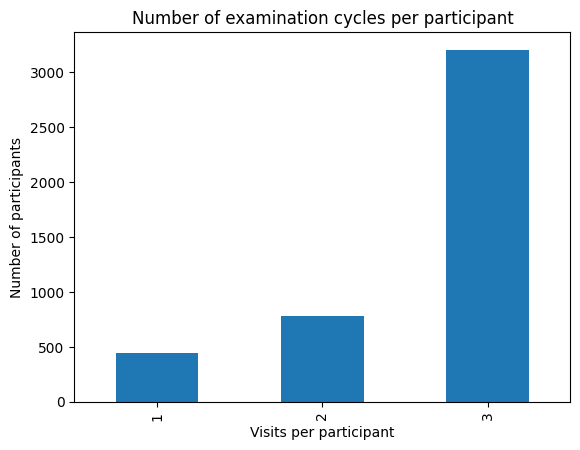

In [ ]:
# @title Distribution of number of examination cycles per participant

cvd['RANDID'].value_counts().value_counts().sort_index().plot(kind='bar')
plt.title('Number of examination cycles per participant')
plt.xlabel('Visits per participant')
plt.ylabel('Number of participants')
plt.show()

## **Missing data**

In [ ]:
# @title Missing data overview
missing = cvd.isna().sum().sort_values(ascending=False)
missing_pct = (missing / len(cvd) * 100).round(2)
missing_summary = pd.DataFrame({'Missing values': missing, '%': missing_pct})
missing_summary[missing_summary['Missing values'] > 0]

,Missing values,%
LDLC,8601,73.97
HDLC,8600,73.97
GLUCOSE,1440,12.38
BPMEDS,593,5.10
TOTCHOL,409,3.52
educ,295,2.54
CIGPDAY,79,0.68
BMI,52,0.45
HEARTRTE,6,0.05


/tmp/ipython-input-413011478.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=missing_pct[missing_pct>0], y=missing_pct[missing_pct>0].index, palette='crest')


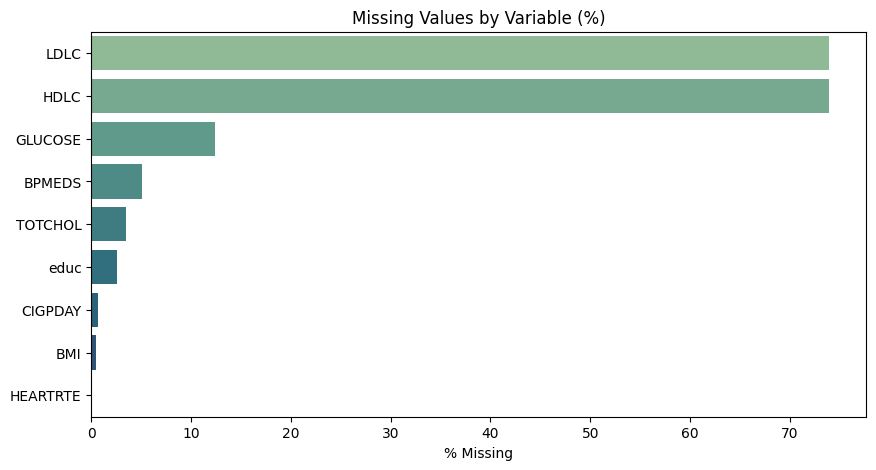

In [ ]:
# @title Visualisation missing data

plt.figure(figsize=(10,5))
sns.barplot(x=missing_pct[missing_pct>0], y=missing_pct[missing_pct>0].index, palette='crest')
plt.title('Missing Values by Variable (%)')
plt.xlabel('% Missing')
plt.ylabel('')
plt.show()

In [ ]:
# @title Missing (%) per column, stratified by PERIOD

def missing_by_group(df, group_col='PERIOD', columns=None, round_to=1):
    if columns is None:
        columns = df.columns.tolist()
    columns = [c for c in columns if c in df.columns] # Keep only columns that exist

    miss = (df.groupby(group_col)[columns]            # Group data by PERIOD
              .apply(lambda d: d.isna().mean()*100)   # Calculate % of missing per oclumn (group)
              .round(round_to))

    return miss

In [ ]:
# @title **FUNCTION:** Missing by group

def plot_missing_by_group(miss_by_group, group_col='PERIOD', cmap='crest', figsize=(8, 4), annotate=True):
    data = miss_by_group.T    # Transpose so variables are rows, groups are columns (more readable)

    fig, ax = plt.subplots(figsize=figsize)
    sns.heatmap(
        data,
        annot=annotate,
        fmt=".1f",
        cmap=cmap,
        cbar_kws={'label': '% Missing'},
        ax=ax
    )
    ax.set_title(f'Missingness by {group_col}', fontsize=13, pad=8)
    ax.set_xlabel(group_col); ax.set_ylabel('Variable')
    fig.tight_layout()
    plt.show()
    return fig, ax

,LDLC,HDLC,GLUCOSE,BPMEDS,TOTCHOL,educ,CIGPDAY,BMI,HEARTRTE
PERIOD,,,,,,,,,
1,100.0,100.0,9.0,1.4,1.2,2.5,0.7,0.4,0.0
2,100.0,100.0,12.2,2.2,3.6,2.5,0.8,0.4,0.0
3,7.3,7.2,17.2,13.7,6.6,2.5,0.4,0.5,0.1


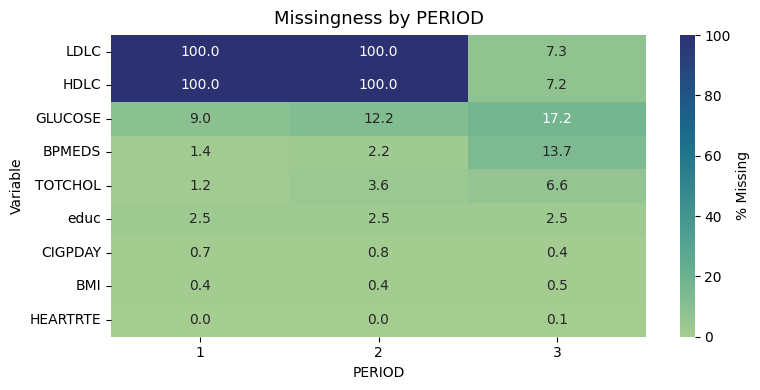

(<Figure size 800x400 with 2 Axes>,
 <Axes: title={'center': 'Missingness by PERIOD'}, xlabel='PERIOD', ylabel='Variable'>)

In [ ]:
# @title Missing (%) per column - Stratified by PERIOD

group_col = 'PERIOD'
cols = [
    'LDLC', 'HDLC', 'GLUCOSE', 'BPMEDS', 'TOTCHOL',
    'educ', 'CIGPDAY', 'BMI', 'HEARTRTE'
]

# Compute % missing by PERIOD
miss_by_period = missing_by_group(
    df=cvd,
    group_col=group_col,
    columns=cols,
    round_to=1
)

# Display the table
display(miss_by_period)

# Plot heatmap
plot_missing_by_group(miss_by_period, group_col=group_col, cmap='crest', figsize=(8, 4), annotate=True)

## **Distribution of data**

### **Numeric distribution**

In [ ]:
# @title **FUNCTION:** Plot numeric distributions - With stratify option

def plot_numeric_distributions(
    df,
    cols,
    bins=25,
    kde=True,
    palette='crest',
    figsize=(12, 6),
    ncols=4,
    stratify_by=None,
    suptitle='Distributions of Numeric Variables'
):

    # Determine grid layout
    n = len(cols)
    nrows = int(np.ceil(n / ncols))
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize, constrained_layout=True)
    axes = np.atleast_1d(axes).ravel()

    # Loop through selected numeric columns
    for i, col in enumerate(cols):
        ax = axes[i]

        if stratify_by and stratify_by in df.columns:
            # Stratify by group
            sns.histplot(
                data=df,
                x=col,
                hue=stratify_by,           # Separate color per group
                bins=bins,
                kde=kde,
                element='step',            # Outline hist style for clarity
                common_norm=False,         # Avoid normalizing across groups
                palette=palette,
                ax=ax
            )
            ax.set_title(f"{col} by {stratify_by}", fontsize=11)
        else:
            # Overall distribution
            sns.histplot(
                data=df,
                x=col,
                bins=bins,
                kde=kde,
                color=sns.color_palette(palette)[-1],  # final tone from palette
                edgecolor='black',
                ax=ax
            )
            ax.set_title(col, fontsize=11)

        ax.set_xlabel('')
        ax.set_ylabel('Count')

    # Hide unused subplots (if grid > variable count)
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    fig.suptitle(suptitle, fontsize=14, y=1.02)
    plt.show()

    return fig, axes

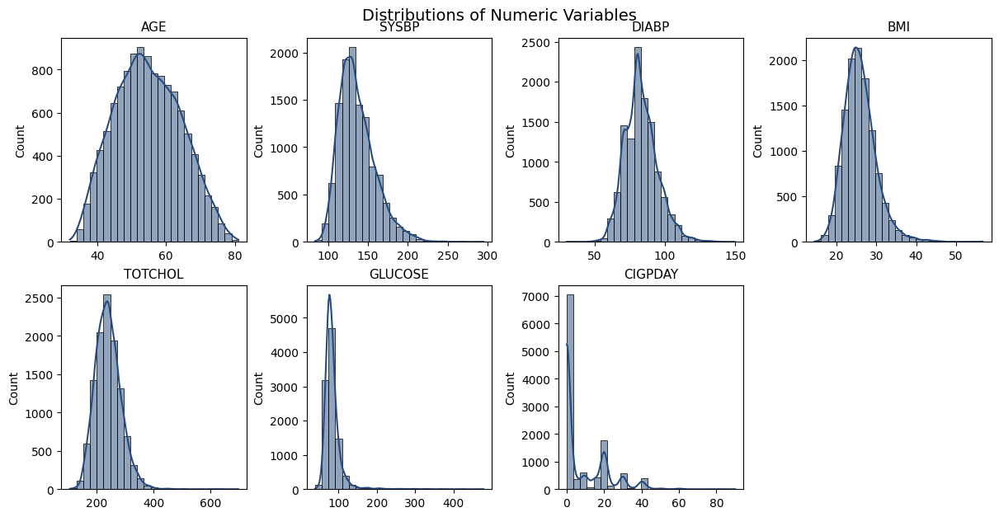

(<Figure size 1200x600 with 8 Axes>,
 array([<Axes: title={'center': 'AGE'}, ylabel='Count'>,
        <Axes: title={'center': 'SYSBP'}, ylabel='Count'>,
        <Axes: title={'center': 'DIABP'}, ylabel='Count'>,
        <Axes: title={'center': 'BMI'}, ylabel='Count'>,
        <Axes: title={'center': 'TOTCHOL'}, ylabel='Count'>,
        <Axes: title={'center': 'GLUCOSE'}, ylabel='Count'>,
        <Axes: title={'center': 'CIGPDAY'}, ylabel='Count'>, <Axes: >],
       dtype=object))

In [ ]:
# @title Overall distribution

num_vars = ['AGE','SYSBP','DIABP','BMI','TOTCHOL','GLUCOSE','CIGPDAY']
plot_numeric_distributions(cvd, num_vars, kde=True, stratify_by=None)

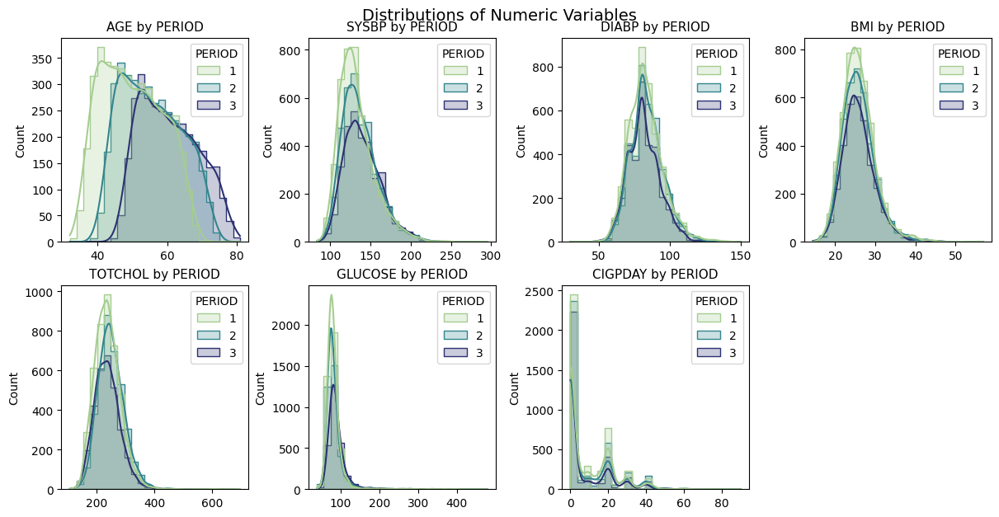

(<Figure size 1200x600 with 8 Axes>,
 array([<Axes: title={'center': 'AGE by PERIOD'}, ylabel='Count'>,
        <Axes: title={'center': 'SYSBP by PERIOD'}, ylabel='Count'>,
        <Axes: title={'center': 'DIABP by PERIOD'}, ylabel='Count'>,
        <Axes: title={'center': 'BMI by PERIOD'}, ylabel='Count'>,
        <Axes: title={'center': 'TOTCHOL by PERIOD'}, ylabel='Count'>,
        <Axes: title={'center': 'GLUCOSE by PERIOD'}, ylabel='Count'>,
        <Axes: title={'center': 'CIGPDAY by PERIOD'}, ylabel='Count'>,
        <Axes: >], dtype=object))

In [ ]:
# @title Distribution - Stratified by PERIOD

plot_numeric_distributions(cvd, num_vars, kde=True, stratify_by='PERIOD')

## **Categorical distribution**

In [ ]:
# @title **FUNCTION:** Plot categorical distribution - Counts with stratify option

def plot_categorical_distributions(
    df,
    cols,
    palette='crest',
    figsize=(12, 6),
    ncols=4,
    stratify_by=None,
    suptitle='Categorical Distributions',
    rotate_x=25,
    show_values=False   # turn off value labels for readability
):

    n = len(cols)
    nrows = int(np.ceil(n / ncols))
    fig, axes = plt.subplots(
        nrows=nrows, ncols=ncols, figsize=figsize, constrained_layout=True
    )
    axes = np.atleast_1d(axes).ravel()

    for i, col in enumerate(cols):
        ax = axes[i]
        # Disable hue if same as x variable
        use_hue = stratify_by and (stratify_by in df.columns) and (stratify_by != col)
        hue_col = stratify_by if use_hue else None

        # Plot
        sns.countplot(
            data=df,
            x=col,
            hue=hue_col,
            palette=palette,
            ax=ax
        )

        ax.set_title(f'{col}' + (f' by {hue_col}' if hue_col else ''), fontsize=11)
        ax.set_xlabel('')
        ax.set_ylabel('Count')
        ax.tick_params(axis='x', rotation=rotate_x)

        # Legend
        if hue_col:
            if i == 0:
                ax.legend(
                    title=hue_col,
                    frameon=False,
                    fontsize=8,
                    title_fontsize=9,
                    loc='upper right'
                )
            else:
                ax.get_legend().remove()
        else:
            leg = ax.get_legend()
            if leg: leg.remove()

        # Bar labels - default = off
        if show_values:
            for container in ax.containers:
                ax.bar_label(container, fmt='%d', padding=2, fontsize=8)

    # Hide empty subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    # Global title
    fig.suptitle(suptitle, fontsize=14, y=1.02)
    plt.show()
    return fig, axes

/tmp/ipython-input-4116368822.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(
/tmp/ipython-input-4116368822.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(
/tmp/ipython-input-4116368822.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(
/tmp/ipython-input-4116368822.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(
/tmp/ipython-input-4116368822.py:29: FutureWarning: 

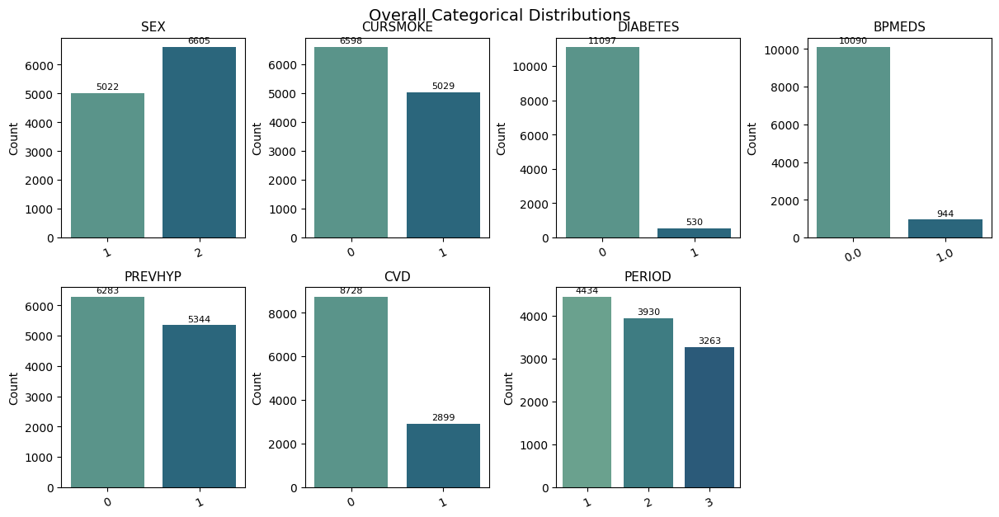

(<Figure size 1200x600 with 8 Axes>,
 array([<Axes: title={'center': 'SEX'}, ylabel='Count'>,
        <Axes: title={'center': 'CURSMOKE'}, ylabel='Count'>,
        <Axes: title={'center': 'DIABETES'}, ylabel='Count'>,
        <Axes: title={'center': 'BPMEDS'}, ylabel='Count'>,
        <Axes: title={'center': 'PREVHYP'}, ylabel='Count'>,
        <Axes: title={'center': 'CVD'}, ylabel='Count'>,
        <Axes: title={'center': 'PERIOD'}, ylabel='Count'>, <Axes: >],
       dtype=object))

In [ ]:
# @title Overall categorical distribution

plot_categorical_distributions(
    df=cvd,
    cols=['SEX','CURSMOKE','DIABETES','BPMEDS','PREVHYP','CVD','PERIOD'],
    stratify_by=None,
    palette='crest',
    show_values=True,        # Show count labels on bars
    suptitle='Overall Categorical Distributions'
)

/tmp/ipython-input-4116368822.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(


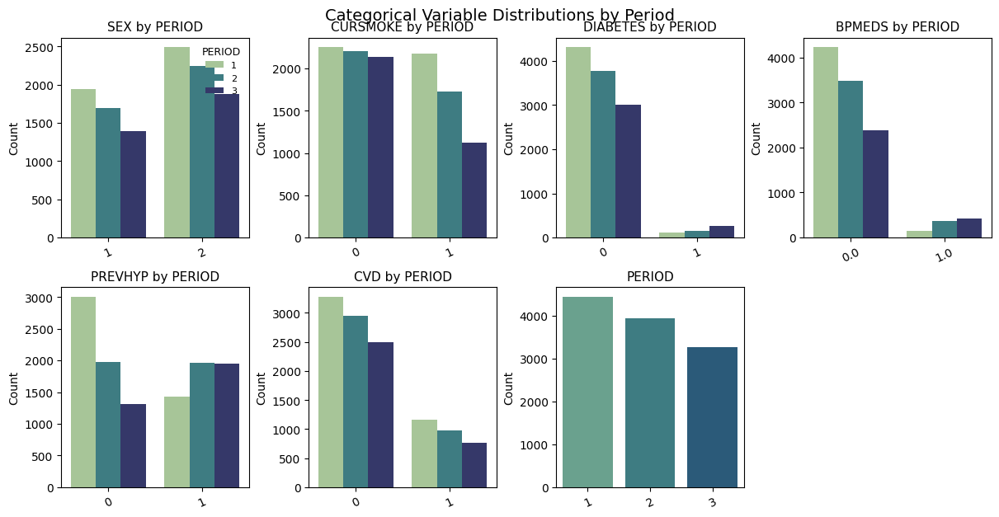

(<Figure size 1200x600 with 8 Axes>,
 array([<Axes: title={'center': 'SEX by PERIOD'}, ylabel='Count'>,
        <Axes: title={'center': 'CURSMOKE by PERIOD'}, ylabel='Count'>,
        <Axes: title={'center': 'DIABETES by PERIOD'}, ylabel='Count'>,
        <Axes: title={'center': 'BPMEDS by PERIOD'}, ylabel='Count'>,
        <Axes: title={'center': 'PREVHYP by PERIOD'}, ylabel='Count'>,
        <Axes: title={'center': 'CVD by PERIOD'}, ylabel='Count'>,
        <Axes: title={'center': 'PERIOD'}, ylabel='Count'>, <Axes: >],
       dtype=object))

In [ ]:
# @title Categorical distribution - Stratified by PERIOD

cat_vars = ['SEX','CURSMOKE','DIABETES','BPMEDS','PREVHYP','CVD','PERIOD']

plot_categorical_distributions(
    df=cvd,
    cols=cat_vars,
    stratify_by='PERIOD',
    palette='crest',
    show_values=False,
    suptitle='Categorical Variable Distributions by Period'
)

## **Outlier detection**

In [ ]:
# @title **Function:** Outlier detection - IQR summary

def detect_outliers_iqr(df, columns=None, multiplier=1.5, sort=True, show_top=None):
    if columns is None:
        columns = df.select_dtypes(include=np.number).columns.tolist()

    summary = {}
    for col in columns:
        s = df[col].replace([np.inf, -np.inf], np.nan).dropna()
        if s.nunique() <= 1:
            continue

        Q1, Q3 = s.quantile([0.25, 0.75])
        IQR = Q3 - Q1
        lower, upper = Q1 - multiplier * IQR, Q3 + multiplier * IQR
        n_outliers = ((s < lower) | (s > upper)).sum()
        pct_outliers = round(n_outliers / len(s) * 100, 2)

        summary[col] = {
            'Q1': Q1, 'Q3': Q3, 'IQR': IQR,
            'Lower_bound': lower, 'Upper_bound': upper,
            'Outlier_count': n_outliers,
            'Percent_outliers': pct_outliers,
            'Valid_N': int(len(s))
        }

    outlier_df = pd.DataFrame(summary).T
    if sort and not outlier_df.empty:
        outlier_df = outlier_df.sort_values('Percent_outliers', ascending=False)

    display(outlier_df.head(show_top) if show_top else outlier_df)
    return outlier_df

In [ ]:
# @title **FUNCTION:** Boxplots per feature

def plot_boxplots_iqr(
    df,
    columns,
    multiplier=1.5,
    ncols=4,
    figsize_row=3.0,
    palette='crest',
    dashed_guides=True,
    suptitle='Outlier Inspection — Boxplots (IQR whiskers)'
):

    # Grid layout
    n = len(columns)
    nrows = int(np.ceil(n / ncols))
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols,
                             figsize=(4*ncols, figsize_row*nrows),
                             constrained_layout=True)
    axes = np.atleast_1d(axes).ravel()

    # Choose single crest tone
    color = sns.color_palette(palette)[-1]
    edgecolor = "0.25"

    for i, col in enumerate(columns):
        ax = axes[i]
        s = df[col].replace([np.inf, -np.inf], np.nan).dropna()
        if s.size == 0:
            ax.set_title(f"{col} (no data)"); ax.axis('off'); continue

        # Bboxplot
        sns.boxplot(
            x=s, ax=ax, color=color, fliersize=2, linewidth=1.2,
            boxprops=dict(edgecolor=edgecolor),
            medianprops=dict(color=edgecolor),
            whiskerprops=dict(color=edgecolor),
            capprops=dict(color=edgecolor)
        )
        ax.set_title(col, fontsize=11)
        ax.set_xlabel('')

        # Dashed IQR guides
        if dashed_guides and s.nunique() > 1:
            Q1, Q3 = s.quantile([0.25, 0.75])
            IQR = Q3 - Q1
            lb = Q1 - multiplier * IQR
            ub = Q3 + multiplier * IQR
            ax.axvline(lb, ls="--", lw=1, color=edgecolor, alpha=0.7)
            ax.axvline(ub, ls="--", lw=1, color=edgecolor, alpha=0.7)

    # Hide empties
    for j in range(i+1, len(axes)):
        axes[j].axis('off')

    fig.suptitle(suptitle, fontsize=13, y=1.02)
    plt.show()
    return fig, axes

In [ ]:
# @title **FUNCTION:** Compute % outliers by group, then plot

def iqr_outlier_summary_by_group(df, columns, group_col='PERIOD', multiplier=1.5):

    out = {}
    for g, sub in df.groupby(group_col):
        col_dict = {}
        for col in columns:
            if col not in sub.columns:
                continue
            s = sub[col].replace([np.inf, -np.inf], np.nan).dropna()
            if s.size <= 1:
                col_dict[col] = np.nan
                continue
            Q1, Q3 = s.quantile([0.25, 0.75])
            IQR = Q3 - Q1
            lb, ub = Q1 - multiplier*IQR, Q3 + multiplier*IQR
            pct = ((s < lb) | (s > ub)).mean() * 100
            col_dict[col] = round(pct, 1)
        out[g] = col_dict
    wide = pd.DataFrame(out).sort_index()
    return wide

In [ ]:
# @title **FUNCTION:** Heatmap - PERIOD

def plot_outliers_heatmap(wide_table, cmap='crest', title='IQR Outliers (%) by Group', figsize=(8,4)):
    if wide_table.empty:
        print("No data to plot."); return None, None
    fig, ax = plt.subplots(figsize=figsize)
    sns.heatmap(wide_table, annot=True, fmt=".1f", cmap=cmap,
                cbar_kws={'label': '% Outliers'}, ax=ax)
    ax.set_title(title, fontsize=13, pad=8)
    ax.set_xlabel('Group'); ax.set_ylabel('Feature')
    fig.tight_layout(); plt.show()
    return fig, ax

In [ ]:
# @title **FUNCTION:** Boxplots by group (one var per subplot; hues = groups)

def plot_boxplots_by_group(
    df,
    columns,
    group_col='PERIOD',
    ncols=3,
    figsize_row=3.4,
    palette='crest',
    suptitle='Boxplots by Group (PERIOD)'
):
    n = len(columns)
    nrows = int(np.ceil(n / ncols))
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols,
                             figsize=(5*ncols, figsize_row*nrows),
                             constrained_layout=True)
    axes = np.atleast_1d(axes).ravel()

    for i, col in enumerate(columns):
        ax = axes[i]
        if col not in df.columns or group_col not in df.columns:
            ax.set_title(f"{col} (missing)"); ax.axis('off'); continue

        # Boxplot
        sns.boxplot(
            data=df,
            x=group_col,
            y=col,
            palette=palette,
            ax=ax
        )
        ax.set_title(f'{col} by {group_col}', fontsize=11)
        ax.set_xlabel(group_col); ax.set_ylabel(col)

    for j in range(i+1, len(axes)):
        axes[j].axis('off')

    fig.suptitle(suptitle, fontsize=13, y=1.02)
    plt.show()
    return fig, axes

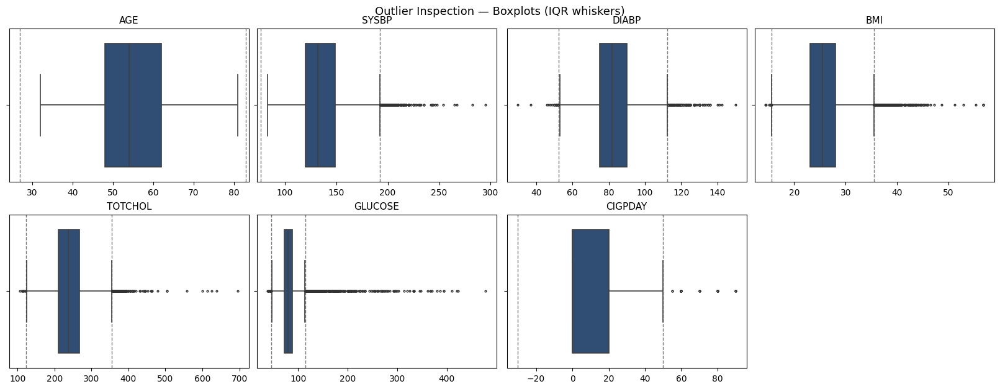

(<Figure size 1600x600 with 8 Axes>,
 array([<Axes: title={'center': 'AGE'}>, <Axes: title={'center': 'SYSBP'}>,
        <Axes: title={'center': 'DIABP'}>, <Axes: title={'center': 'BMI'}>,
        <Axes: title={'center': 'TOTCHOL'}>,
        <Axes: title={'center': 'GLUCOSE'}>,
        <Axes: title={'center': 'CIGPDAY'}>, <Axes: >], dtype=object))

In [ ]:
# @title Boxplots overall

num_vars = ['AGE','SYSBP','DIABP','BMI','TOTCHOL','GLUCOSE','CIGPDAY']
plot_boxplots_iqr(cvd, columns=num_vars, multiplier=1.5, ncols=4)

/tmp/ipython-input-3592032032.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-3592032032.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-3592032032.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-3592032032.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-3592032032.py:25: FutureWarning: 

Passin

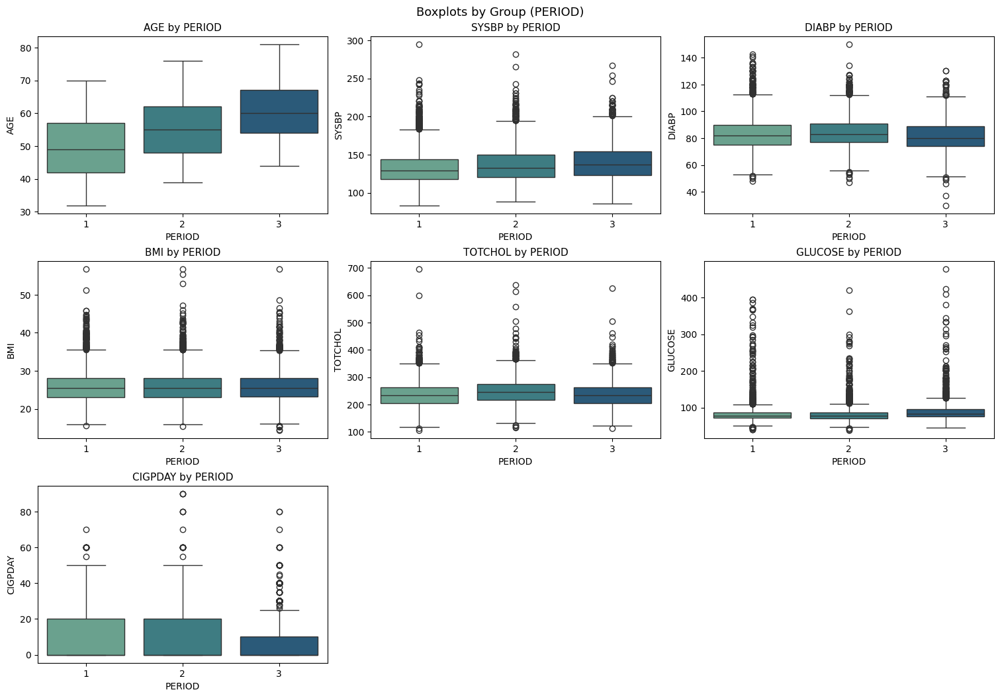

(<Figure size 1500x1020 with 9 Axes>,
 array([<Axes: title={'center': 'AGE by PERIOD'}, xlabel='PERIOD', ylabel='AGE'>,
        <Axes: title={'center': 'SYSBP by PERIOD'}, xlabel='PERIOD', ylabel='SYSBP'>,
        <Axes: title={'center': 'DIABP by PERIOD'}, xlabel='PERIOD', ylabel='DIABP'>,
        <Axes: title={'center': 'BMI by PERIOD'}, xlabel='PERIOD', ylabel='BMI'>,
        <Axes: title={'center': 'TOTCHOL by PERIOD'}, xlabel='PERIOD', ylabel='TOTCHOL'>,
        <Axes: title={'center': 'GLUCOSE by PERIOD'}, xlabel='PERIOD', ylabel='GLUCOSE'>,
        <Axes: title={'center': 'CIGPDAY by PERIOD'}, xlabel='PERIOD', ylabel='CIGPDAY'>,
        <Axes: >, <Axes: >], dtype=object))

In [ ]:
# @title Boxplots by PERIOD

plot_boxplots_by_group(cvd, columns=num_vars, group_col='PERIOD', ncols=3)

In [ ]:
# @title Outlier summary - IQR method

num_vars = ['AGE','SYSBP','DIABP','BMI','TOTCHOL','GLUCOSE','CIGPDAY']

outlier_summary = detect_outliers_iqr(cvd, columns=num_vars)

,Q1,Q3,IQR,Lower_bound,Upper_bound,Outlier_count,Percent_outliers,Valid_N
GLUCOSE,72.000,89.00,17.000,46.5000,114.5000,582.0,5.71,10187.0
BMI,23.095,28.07,4.975,15.6325,35.5325,276.0,2.38,11575.0
SYSBP,120.000,149.00,29.000,76.5000,192.5000,264.0,2.27,11627.0
DIABP,75.000,90.00,15.000,52.5000,112.5000,176.0,1.51,11627.0
TOTCHOL,210.000,268.00,58.000,123.0000,355.0000,151.0,1.35,11218.0
CIGPDAY,0.000,20.00,20.000,-30.0000,50.0000,40.0,0.35,11548.0
AGE,48.000,62.00,14.000,27.0000,83.0000,0.0,0.00,11627.0


In [ ]:
# @title Clipping - Extreme outliers

cvd_capped = cvd.copy()

ranges = {
    # Age range of adults in Framingham cohort (study inclusion 30–81 years)
    # Dawber et al., Am J Public Health, 1951 (Framingham design)
    'AGE': (30, 90),

    # Systolic blood pressure:
    # <80 = hypotension; >250 = critical hypertensive crisis.
    # Whelton PK et al., 2024 AHA/ACC/ASH Hypertension Guideline
    # doi:10.1161/CIR.0000000000001356
    'SYSBP': (80, 250),

    # Diastolic blood pressure:
    # <40 = shock-level hypotension; >140 = severe hypertensive crisis.
    # Whelton PK et al., 2024 AHA/ACC/ASH Hypertension Guideline
    # doi:10.1161/CIR.0000000000001356
    'DIABP': (40, 140),

    # Body Mass Index:
    # <15 = severe anorexia threshold (NIH criteria, NCBI Bookshelf NBK519704)
    # >70 = extreme obesity, likely data entry artifact.
    'BMI': (15, 70),

    # Total Cholesterol:
    # <75 mg/dL = hypocholesterolemia (malnutrition/liver disease)
    # >600 mg/dL = extreme familial hypercholesterolemia
    # Grundy SM et al., 2019 AHA/ACC Cholesterol Guideline
    # doi:10.1161/CIR.0000000000000625
    'TOTCHOL': (75, 600),

    # Glucose:
    # <40 mg/dL = severe hypoglycemia; >500 mg/dL = hyperglycemic crisis
    # American Diabetes Association, 2024 Standards of Care;
    # NCBI Bookshelf: Glucose Physiology and Regulation (NBK279510)
    'GLUCOSE': (40, 500),

    # Cigarettes per day:
    # >90 (≈4.5 packs/day)
    'CIGPDAY': (0, 90)
}

for col, (low, high) in ranges.items():
    if col in cvd_capped.columns:
        cvd_capped[col] = cvd_capped[col].clip(lower=low, upper=high)

print("Extreme values capped within clinically defensible bounds → cvd_capped")

Extreme values capped within clinically defensible bounds → cvd_capped


,1,2,3
AGE,0.0,0.0,0.0
BMI,2.4,2.5,2.5
CIGPDAY,0.3,0.5,8.7
DIABP,2.0,1.7,0.9
GLUCOSE,5.4,5.9,5.2
SYSBP,3.4,1.9,1.3
TOTCHOL,1.2,1.4,1.2


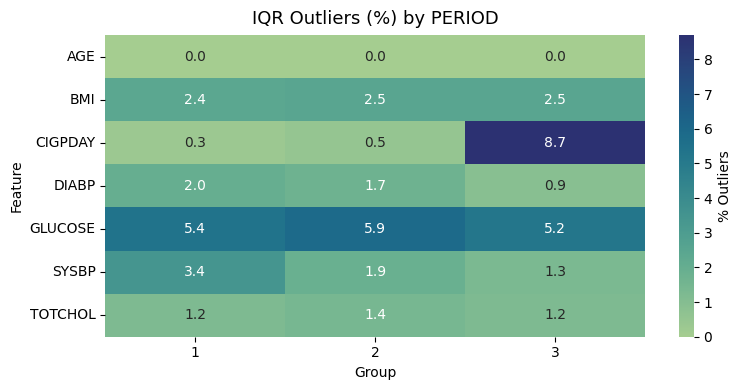

(<Figure size 800x400 with 2 Axes>,
 <Axes: title={'center': 'IQR Outliers (%) by PERIOD'}, xlabel='Group', ylabel='Feature'>)

In [ ]:
# @title Outlier summary by PERIOD - Table + heatmap

num_vars = ['AGE','SYSBP','DIABP','BMI','TOTCHOL','GLUCOSE','CIGPDAY']
wide = iqr_outlier_summary_by_group(cvd_capped, columns=num_vars, group_col='PERIOD', multiplier=1.5)
display(wide)
plot_outliers_heatmap(wide, title='IQR Outliers (%) by PERIOD')

In [ ]:
# @title BASELINE SUBSET (cvd_cleaned) for 1-row-per-person analysis
cvd_baseline = (
    cvd_capped.sort_values(['RANDID','PERIOD'])
              .groupby('RANDID')
              .first()
              .reset_index()
)

# Drop identifiers/leakage outcomes: baseline only features!!
leak_cols = [c for c in cvd_baseline.columns if c.startswith('TIME')] + \
            ['RANDID','CVD','STROKE','ANYCHD','HYPERTEN','DEATH']
cvd_cleaned = cvd_baseline.drop(columns=leak_cols, errors='ignore')

print("Built cvd_cleaned (baseline 1-row-per-person, no leakage). Shape:", cvd_cleaned.shape)

Built cvd_cleaned (baseline 1-row-per-person, no leakage). Shape: (4434, 24)


/tmp/ipython-input-3592032032.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-3592032032.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-3592032032.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-3592032032.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/tmp/ipython-input-3592032032.py:25: FutureWarning: 

Passin

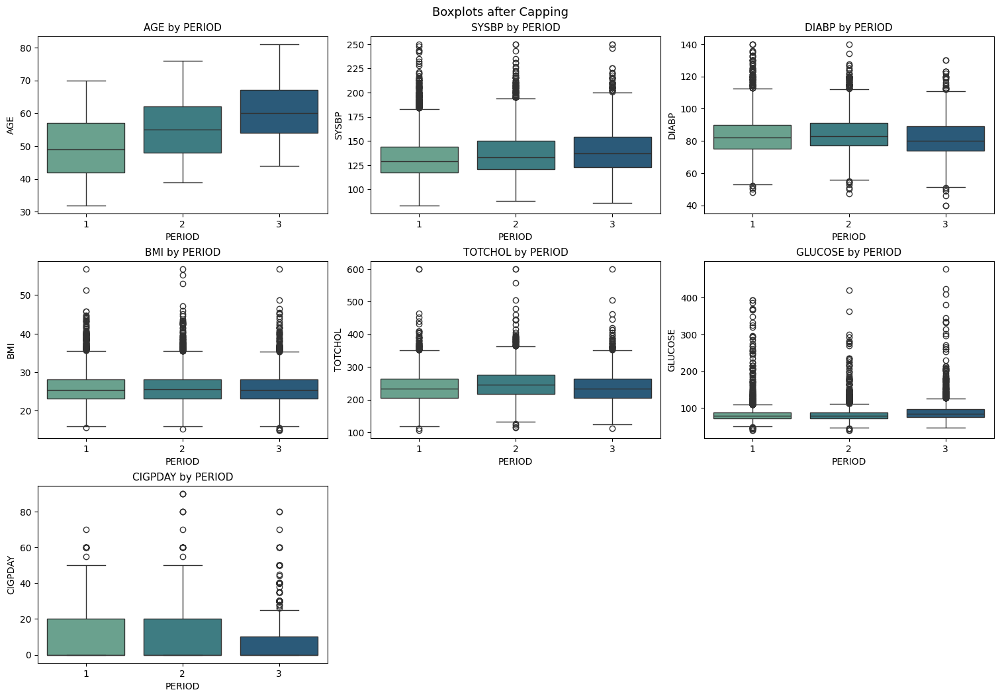

,Variable,Below lower bound,Above upper bound,Total capped
1,SYSBP,0,5,5
2,DIABP,2,3,5
4,TOTCHOL,0,4,4
3,BMI,2,0,2
5,GLUCOSE,1,0,1
0,AGE,0,0,0
6,CIGPDAY,0,0,0


In [ ]:
# @title Boxplots by group after capping

# Boxplots by group after capping
plot_boxplots_by_group(cvd_capped, columns=num_vars, group_col='PERIOD', ncols=3,
                       suptitle='Boxplots after Capping')

# How many values were capped per variable (recomputed vs cvd_capped)
flag_summary = []
for col, (low, high) in ranges.items():
    if col in cvd.columns:
        below_low = (cvd[col] < low).sum()
        above_high = (cvd[col] > high).sum()
        total_capped = below_low + above_high
        flag_summary.append({
            'Variable': col,
            'Below lower bound': below_low,
            'Above upper bound': above_high,
            'Total capped': total_capped
        })
flag_df = pd.DataFrame(flag_summary)
display(flag_df.sort_values('Total capped', ascending=False))

,Variable,Below lower bound,Above upper bound,Total capped
1,SYSBP,0,5,5
2,DIABP,2,3,5
4,TOTCHOL,0,4,4
3,BMI,2,0,2
5,GLUCOSE,1,0,1
0,AGE,0,0,0
6,CIGPDAY,0,0,0


/tmp/ipython-input-2479057572.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=flag_df, x='Total capped', y='Variable', palette='crest')


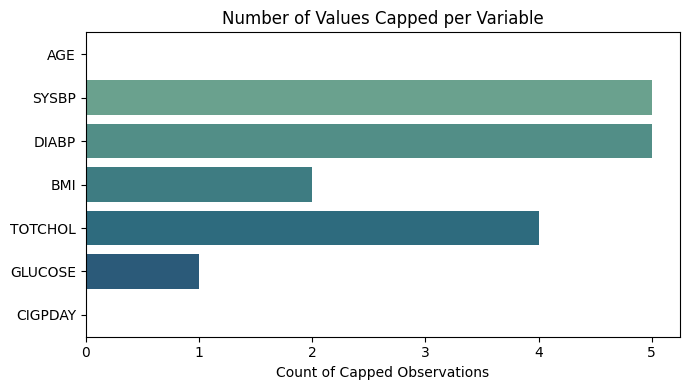

In [ ]:
# @title Log how many values were capped per variable

flag_summary = []

for col, (low, high) in ranges.items():
    if col in cvd.columns:
        below_low = (cvd[col] < low).sum()
        above_high = (cvd[col] > high).sum()
        total_capped = below_low + above_high
        flag_summary.append({
            'Variable': col,
            'Below lower bound': below_low,
            'Above upper bound': above_high,
            'Total capped': total_capped
        })

flag_df = pd.DataFrame(flag_summary)
display(flag_df.sort_values('Total capped', ascending=False))

# Optional: barplot visualization
plt.figure(figsize=(7,4))
sns.barplot(data=flag_df, x='Total capped', y='Variable', palette='crest')
plt.title('Number of Values Capped per Variable')
plt.xlabel('Count of Capped Observations')
plt.ylabel('')
plt.tight_layout()
plt.show()

## **Outcome imbalance**

In [ ]:
# @title How many participants experienced CVD

for outcome in ['CVD','STROKE','ANYCHD','HYPERTEN','DEATH']:
    if outcome in cvd.columns:
        counts = cvd[outcome].value_counts()
        print(f"\n{outcome}:\n", counts, "\nPercent positive:", round(counts[1]/len(cvd)*100,2) if 1 in counts else 0)


CVD:
 CVD
0    8728
1    2899
Name: count, dtype: int64 
Percent positive: 24.93

STROKE:
 STROKE
0    10566
1     1061
Name: count, dtype: int64 
Percent positive: 9.13

ANYCHD:
 ANYCHD
0    8469
1    3158
Name: count, dtype: int64 
Percent positive: 27.16

HYPERTEN:
 HYPERTEN
1    8642
0    2985
Name: count, dtype: int64 
Percent positive: 74.33

DEATH:
 DEATH
0    8100
1    3527
Name: count, dtype: int64 
Percent positive: 30.33


## **Correlation and relationships**

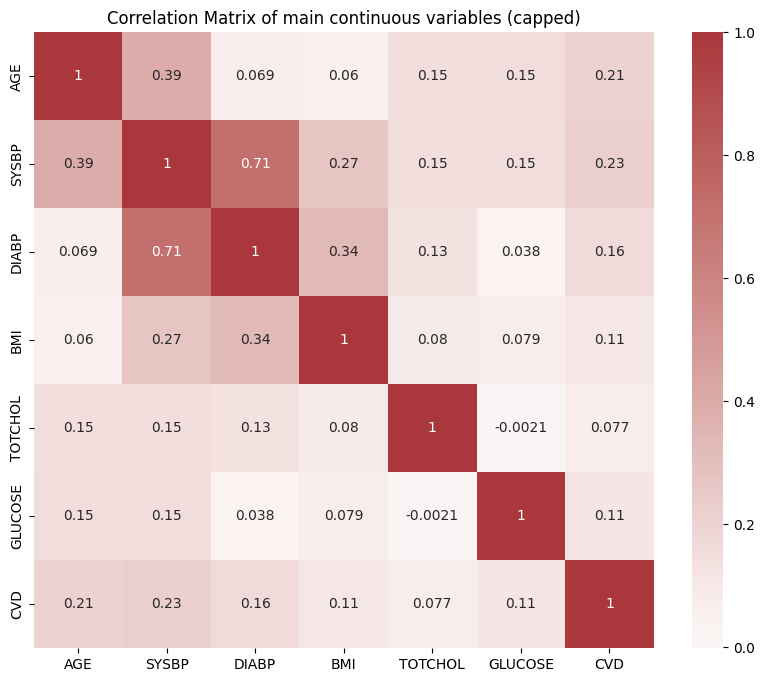

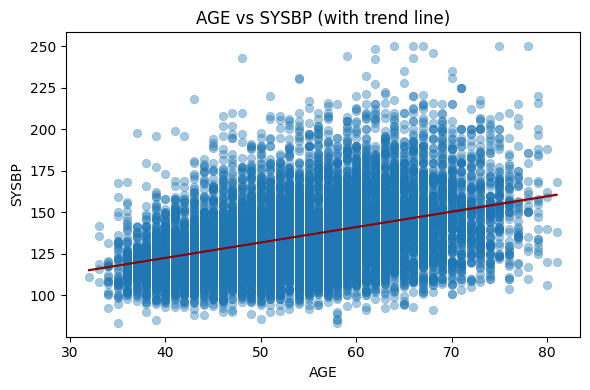

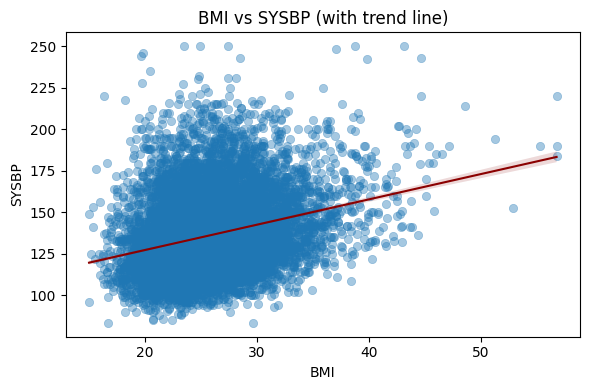

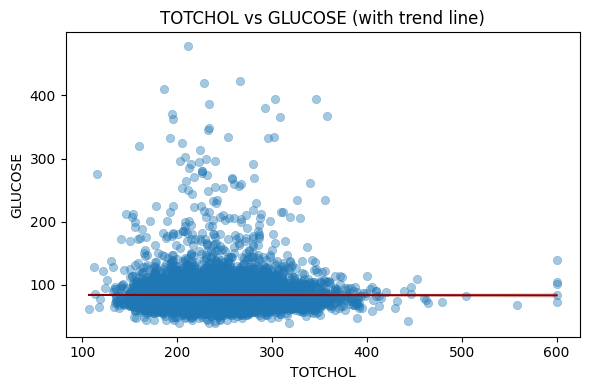

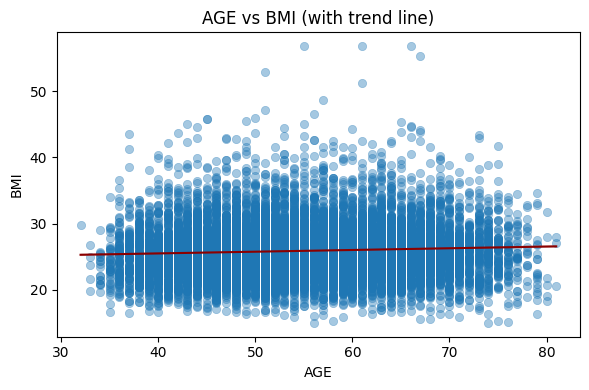

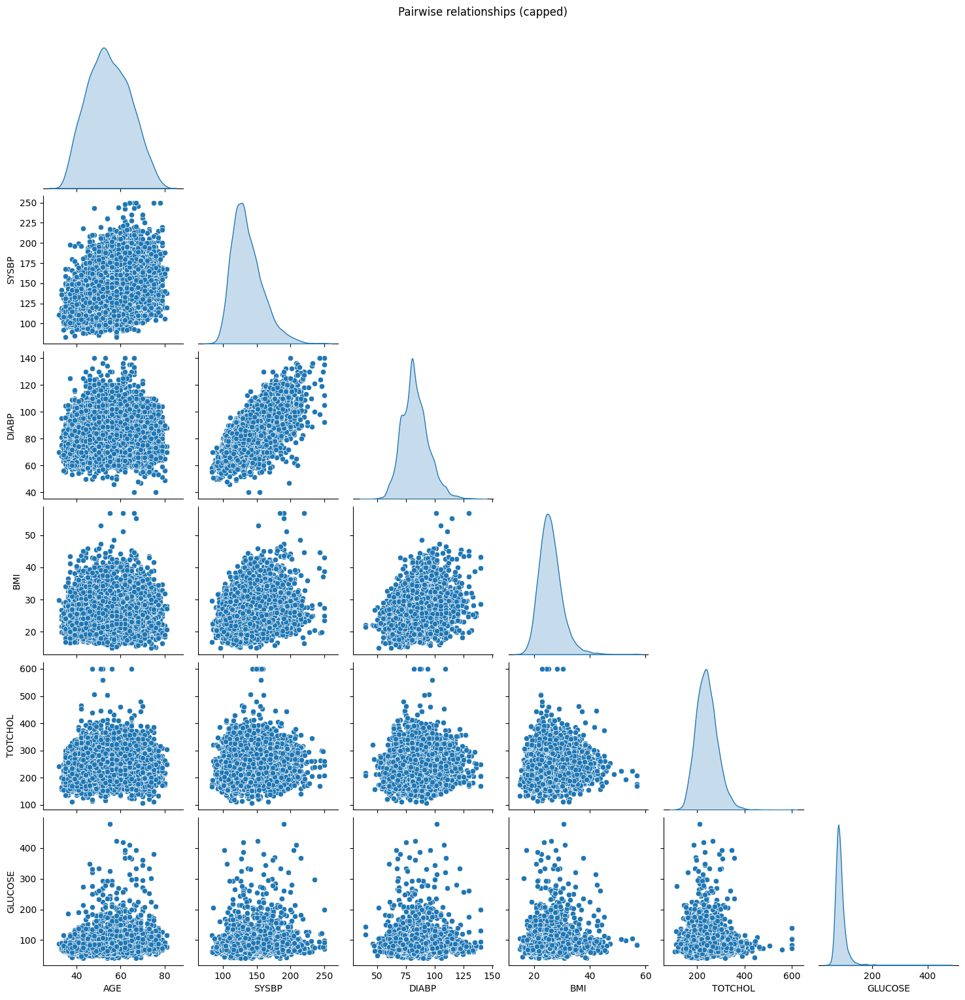

In [ ]:
# @title Correlation matrix + relationship plots

# Correlation matrix on capped data
plt.figure(figsize=(10,8))
corr = cvd_capped[['AGE','SYSBP','DIABP','BMI','TOTCHOL','GLUCOSE','CVD']].corr()
sns.heatmap(corr, annot=True, cmap='vlag', center=0)
plt.title('Correlation Matrix of main continuous variables (capped)')
plt.show()

# Scatterplots on capped data
pairs = [('AGE','SYSBP'), ('BMI','SYSBP'), ('TOTCHOL','GLUCOSE'), ('AGE','BMI')]
for x, y in pairs:
    plt.figure(figsize=(6,4))
    sns.scatterplot(data=cvd_capped, x=x, y=y, alpha=0.4, edgecolor=None)
    sns.regplot(data=cvd_capped, x=x, y=y, scatter=False, color='darkred', line_kws={'linewidth':1.5})
    plt.title(f'{x} vs {y} (with trend line)')
    plt.tight_layout()
    plt.show()

# Pairplot (capped)
sns.pairplot(cvd_capped[['AGE','SYSBP','DIABP','BMI','TOTCHOL','GLUCOSE']], diag_kind='kde', corner=True)
plt.suptitle('Pairwise relationships (capped)', y=1.02)
plt.show()

## **Data cleaning**

In [ ]:
# @title Missing (%) overall dataset

missing_pct = (cvd_capped.isna().mean() * 100).round(2)
display(missing_pct[missing_pct > 0].sort_values(ascending=False))

# Copy of dataset to start imputation
cvd_imputed = cvd_capped.copy()

,0
HDLC,73.97
LDLC,73.97
GLUCOSE,12.38
BPMEDS,5.10
TOTCHOL,3.52
educ,2.54
CIGPDAY,0.68
BMI,0.45
HEARTRTE,0.05


## **Missingness analysis**

| Variable | % Missing | Interpretation |
|-----------|------------|----------------|
| LDLC | 73.97| Measured only in Period 3 → structural missingness (MNAR) |
| HDLC | 73.97| Measured only in Period 3 → structural missingness (MNAR) |
| GLUCOSE | 12.38 | Low lab missingness → patient or lab factors (MAR) |
| BPMEDS | 5.10| Almost complete → random entry error (MCAR)|
| TOTCHOL | 3.52 | Negligible missingness → lab factors? (MCAR)|
| educ | 2.54 | Minor sociodemographic missingness → nonresponsesoci (likely MAR) |
|CIGPDAY|0.68| Random nonresponse (MCAR)|
| BMI | 0.45 | Random recording or measurement (MCAR)|
|HEARTRTE| 0.05|Ignorable, almost complete|


**Interpretation:**  

**MCAR (Completely at Random)**

Data are missing by chance; imputation has minimal bias risk (e.g., BMI, TOTCHOL, BPMEDS).

**MAR (At Random)**

Missingness is related to other observed variables but not to the missing value itself (e.g., education, glucose). Median or model-based imputation is sufficient.

**MNAR (Not at Random)**
  
Missingness is due to study design or unobserved factors (HDLC, LDLC). Imputation would distort meaning; Variables should be excluded or analyzed separately (Period 3 subset).



In [ ]:
# @title Impute missing values (after capping)

from sklearn.impute import SimpleImputer

# Copy capped data to avoid overwriting
cvd_imputed = cvd_capped.copy()

# Numeric and categorical columns
num_cols = ['GLUCOSE', 'TOTCHOL', 'CIGPDAY', 'BMI', 'HEARTRTE']
cat_cols = ['BPMEDS', 'educ']

# 1. Drop variables measured only in Period 3 (MNAR)
exclude_vars = ['HDLC', 'LDLC']
cvd_imputed = cvd_imputed.drop(columns=exclude_vars, errors='ignore')

# 2. Define imputers
imp_median = SimpleImputer(strategy='median')
imp_mode   = SimpleImputer(strategy='most_frequent')

# 3. Apply imputers
cvd_imputed[num_cols] = imp_median.fit_transform(cvd_imputed[num_cols])
cvd_imputed[cat_cols] = imp_mode.fit_transform(cvd_imputed[cat_cols])

print(f"Dropped MNAR variables: {exclude_vars}")
print("Remaining missing values:", cvd_imputed.isna().sum().sum())

Dropped MNAR variables: ['HDLC', 'LDLC']
Remaining missing values: 0


In [ ]:
# Check check double check remaining missingness
cvd_imputed.isnull().sum()

,0
RANDID,0
SEX,0
TOTCHOL,0
AGE,0
SYSBP,0
DIABP,0
CURSMOKE,0
CIGPDAY,0
BMI,0
DIABETES,0


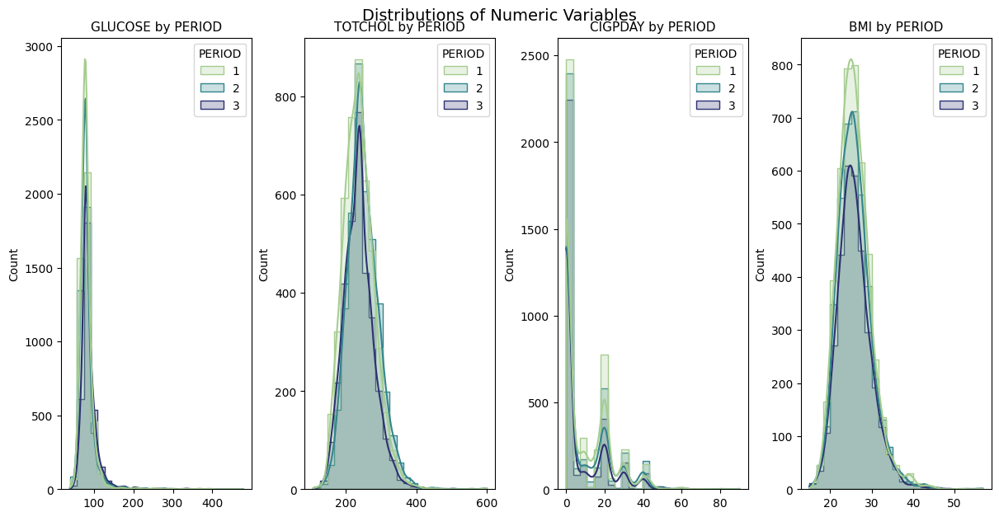

(<Figure size 1200x600 with 4 Axes>,
 array([<Axes: title={'center': 'GLUCOSE by PERIOD'}, ylabel='Count'>,
        <Axes: title={'center': 'TOTCHOL by PERIOD'}, ylabel='Count'>,
        <Axes: title={'center': 'CIGPDAY by PERIOD'}, ylabel='Count'>,
        <Axes: title={'center': 'BMI by PERIOD'}, ylabel='Count'>],
       dtype=object))

In [ ]:
# @title Distribution plots **after** imputation

plot_numeric_distributions(cvd_imputed, ['GLUCOSE','TOTCHOL','CIGPDAY','BMI'], kde=True, stratify_by='PERIOD')

In [ ]:
# @title Check SEX coding
# 1=Male, 2=Female (dataset default)

cvd_imputed[['SEX']].value_counts(dropna=False)

,count
SEX,
2,6605
1,5022


In [ ]:
# @title Recode binary variables and SEX

# Identify binary columns (only 0/1 values)
binary_cols = [
    c for c in cvd_imputed.columns
    if set(cvd_imputed[c].dropna().unique()) <= {0, 1}
]

# Convert all binary columns to int for consistency
cvd_imputed[binary_cols] = cvd_imputed[binary_cols].astype(int)

# SEX recoding (1=Male, 2=Female >> 0/1)

if 'SEX' in cvd_imputed.columns:
    # Convert to numeric 0/1
    cvd_imputed['SEX'] = cvd_imputed['SEX'].map({1: 0, 2: 1}).astype(int)

print("SEX recoded: 0 = Male, 1 = Female")
cvd_imputed[['SEX']].value_counts(dropna=False)

print(f"\nBinary columns standardized: {len(binary_cols)}")

SEX recoded: 0 = Male, 1 = Female

Binary columns standardized: 16


In [ ]:
# @title Check if SEX is recoded correctly

cvd_imputed[['SEX']].value_counts(dropna=False)

,count
SEX,
1,6605
0,5022


In [ ]:
# @title Varify binary vars

cvd_imputed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11627 entries, 0 to 11626
Data columns (total 37 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   RANDID    11627 non-null  int64  
 1   SEX       11627 non-null  int64  
 2   TOTCHOL   11627 non-null  float64
 3   AGE       11627 non-null  int64  
 4   SYSBP     11627 non-null  float64
 5   DIABP     11627 non-null  float64
 6   CURSMOKE  11627 non-null  int64  
 7   CIGPDAY   11627 non-null  float64
 8   BMI       11627 non-null  float64
 9   DIABETES  11627 non-null  int64  
 10  BPMEDS    11627 non-null  int64  
 11  HEARTRTE  11627 non-null  float64
 12  GLUCOSE   11627 non-null  float64
 13  educ      11627 non-null  float64
 14  PREVCHD   11627 non-null  int64  
 15  PREVAP    11627 non-null  int64  
 16  PREVMI    11627 non-null  int64  
 17  PREVSTRK  11627 non-null  int64  
 18  PREVHYP   11627 non-null  int64  
 19  TIME      11627 non-null  int64  
 20  PERIOD    11627 non-null  in

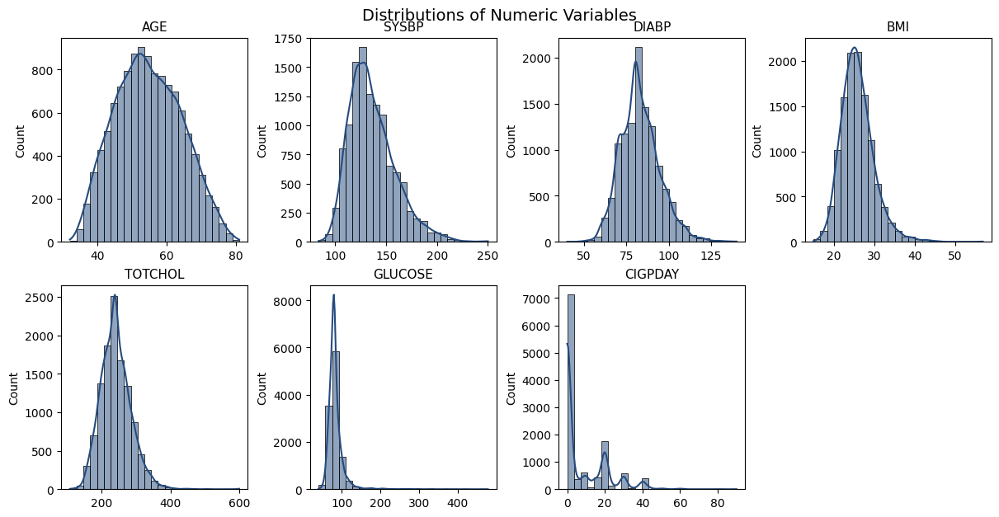

(<Figure size 1200x600 with 8 Axes>,
 array([<Axes: title={'center': 'AGE'}, ylabel='Count'>,
        <Axes: title={'center': 'SYSBP'}, ylabel='Count'>,
        <Axes: title={'center': 'DIABP'}, ylabel='Count'>,
        <Axes: title={'center': 'BMI'}, ylabel='Count'>,
        <Axes: title={'center': 'TOTCHOL'}, ylabel='Count'>,
        <Axes: title={'center': 'GLUCOSE'}, ylabel='Count'>,
        <Axes: title={'center': 'CIGPDAY'}, ylabel='Count'>, <Axes: >],
       dtype=object))

In [ ]:
# @title Overall numeric distributions post-cleaning

# After cleaning + imputation
num_cols = ['AGE', 'SYSBP', 'DIABP', 'BMI', 'TOTCHOL', 'GLUCOSE', 'CIGPDAY']

plot_numeric_distributions(
    df=cvd_imputed,
    cols=num_cols,
    kde=True,
    stratify_by=None,
    palette='crest'
)

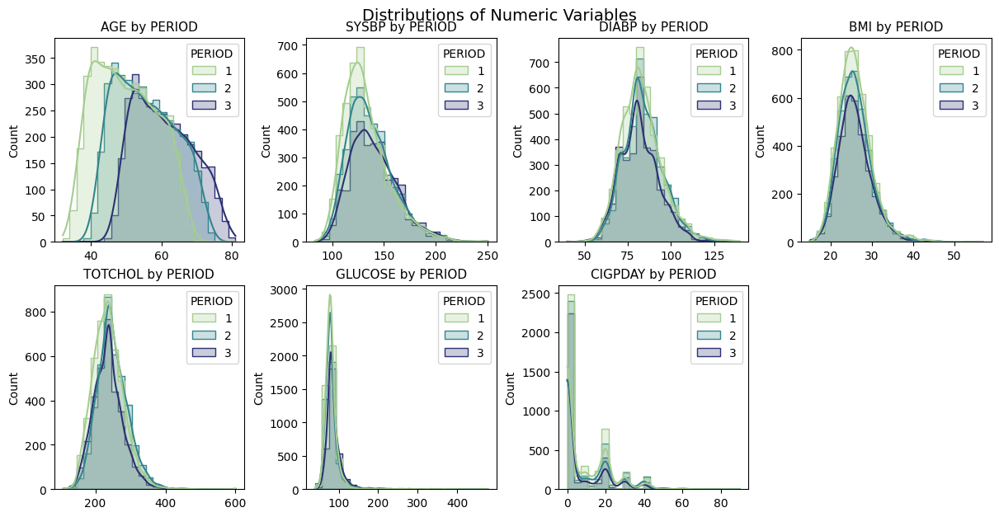

(<Figure size 1200x600 with 8 Axes>,
 array([<Axes: title={'center': 'AGE by PERIOD'}, ylabel='Count'>,
        <Axes: title={'center': 'SYSBP by PERIOD'}, ylabel='Count'>,
        <Axes: title={'center': 'DIABP by PERIOD'}, ylabel='Count'>,
        <Axes: title={'center': 'BMI by PERIOD'}, ylabel='Count'>,
        <Axes: title={'center': 'TOTCHOL by PERIOD'}, ylabel='Count'>,
        <Axes: title={'center': 'GLUCOSE by PERIOD'}, ylabel='Count'>,
        <Axes: title={'center': 'CIGPDAY by PERIOD'}, ylabel='Count'>,
        <Axes: >], dtype=object))

In [ ]:
# @title Overall numeric distributions post-cleaning by PERIOD

num_cols = ['AGE', 'SYSBP', 'DIABP', 'BMI', 'TOTCHOL', 'GLUCOSE', 'CIGPDAY']

plot_numeric_distributions(
    df=cvd_imputed,
    cols=num_cols,
    kde=True,
    stratify_by='PERIOD',
    palette='crest'
)

## **Log transformation**

Data still shows skewness after imputation. Use log1p (log(x+1)) for transformation as it takes 0 into account.

CIGPDAY will not change much because of very high zero count. We can consider binning this or use binary variable (0=Non-smoker, 1=smoker).

In [ ]:
# @title log1p transformation

cvd_imputed['GLUCOSE_LOG'] = np.log1p(cvd_imputed['GLUCOSE'])
cvd_imputed['CIGPDAY_LOG'] = np.log1p(cvd_imputed['CIGPDAY'])
cvd_imputed['TOTCHOL_LOG'] = np.log1p(cvd_imputed['TOTCHOL'])

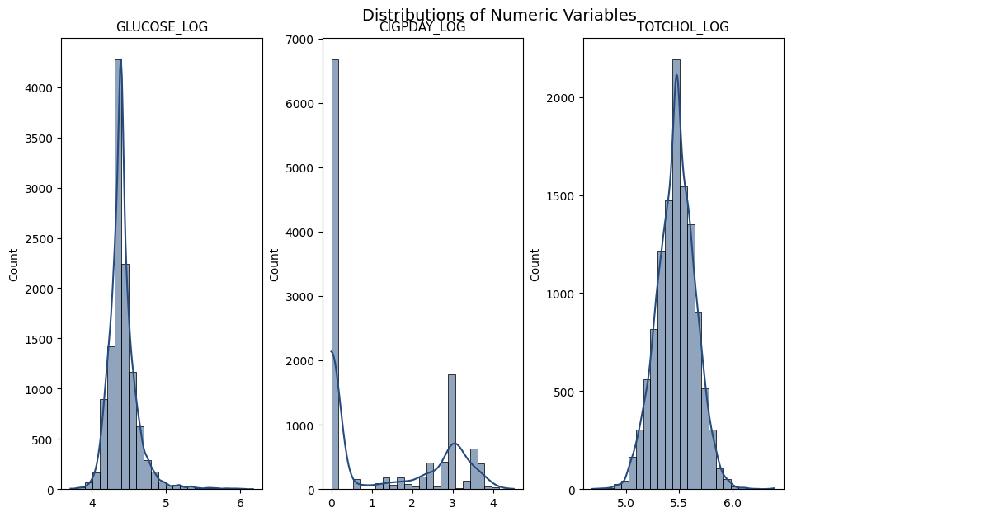

(<Figure size 1200x600 with 4 Axes>,
 array([<Axes: title={'center': 'GLUCOSE_LOG'}, ylabel='Count'>,
        <Axes: title={'center': 'CIGPDAY_LOG'}, ylabel='Count'>,
        <Axes: title={'center': 'TOTCHOL_LOG'}, ylabel='Count'>, <Axes: >],
       dtype=object))

In [ ]:
# @title Check log transformed variables

plot_numeric_distributions(
    cvd_imputed,
    ['GLUCOSE_LOG', 'CIGPDAY_LOG', 'TOTCHOL_LOG'],
    kde=True
)

## **New var: pulse pressure variable**

* Represents arterial stiffness
* High (>60 mmHg) is linked to increased cvd risk (especially with increasing age)
* We will look at the difference (delta, Δ) of pulse pressure between period 1 and 2 to predict CVD in period 3


**Pulse pressure = systolic blood pressure - diastolic blood pressure**

In [ ]:
# @title Create Pulse Pressure variable (SYSBP − DIABP)

# Make copy and work foolproof lol
cvd_features = cvd_imputed.copy()

# Create new variable
cvd_features['PULSE_PRESSURE'] = cvd_features['SYSBP'] - cvd_features['DIABP']

print(cvd_features['PULSE_PRESSURE'].describe().round(2))

count    11627.00
mean        53.28
std         16.60
min         15.00
25%         41.50
50%         50.00
75%         61.50
max        158.00
Name: PULSE_PRESSURE, dtype: float64


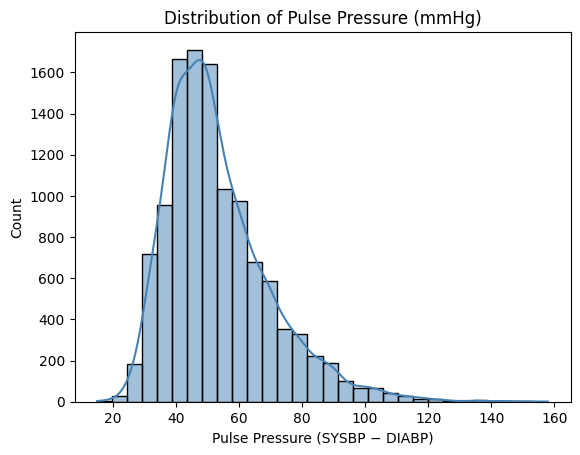

/tmp/ipython-input-2274301597.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=cvd_features, x='PERIOD', y='PULSE_PRESSURE', palette='crest')


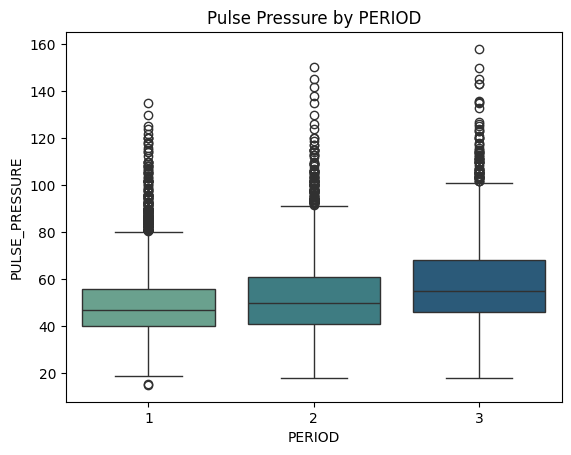

In [ ]:
# @title Distribution pulse pressure

# Overall distribution
sns.histplot(data=cvd_features, x='PULSE_PRESSURE', bins=30, kde=True, color='steelblue')
plt.title('Distribution of Pulse Pressure (mmHg)')
plt.xlabel('Pulse Pressure (SYSBP − DIABP)')
plt.show()

# By PERIOD
sns.boxplot(data=cvd_features, x='PERIOD', y='PULSE_PRESSURE', palette='crest')
plt.title('Pulse Pressure by PERIOD')
plt.show()

/tmp/ipython-input-2055573037.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=cvd_features, x='SEX', y='PULSE_PRESSURE', palette='crest')


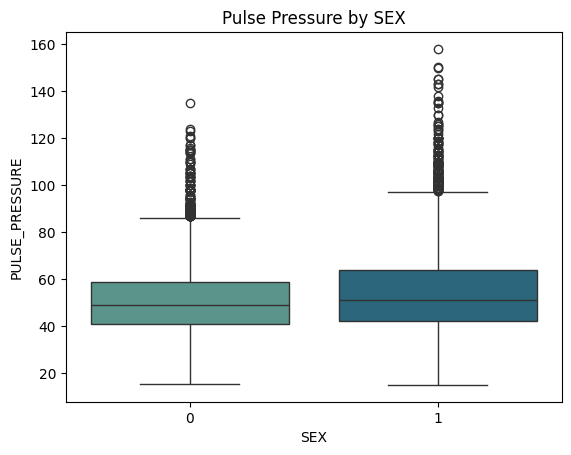

In [ ]:
# By SEX
sns.boxplot(data=cvd_features, x='SEX', y='PULSE_PRESSURE', palette='crest')
plt.title('Pulse Pressure by SEX')
plt.show()

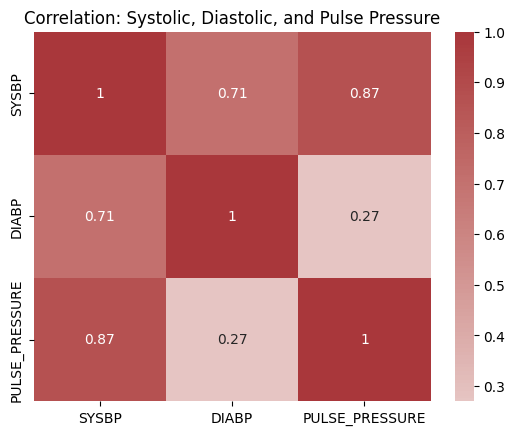

In [ ]:
# @title Correlation with other BP var
# Should be moderate with SYSBP, weak with DIABP

pp_corr = cvd_features[['SYSBP','DIABP','PULSE_PRESSURE']].corr().round(2)
sns.heatmap(pp_corr, annot=True, cmap='vlag', center=0)
plt.title('Correlation: Systolic, Diastolic, and Pulse Pressure')
plt.show()

In [ ]:
# @title Calculate change in Pulse Pressure (Period 2 - Period 1)
pp_change = (
    cvd_features
    .pivot_table(index='RANDID', columns='PERIOD', values='PULSE_PRESSURE')
    .assign(DELTA_PP=lambda d: d[2] - d[1])
    [['DELTA_PP']]
    .reset_index()
)

# Merge with outcome (CVD at Period 3)
outcome = cvd_features[cvd_features['PERIOD'] == 3][['RANDID', 'CVD']]
analysis_df = pp_change.merge(outcome, on='RANDID')

display(analysis_df.head())

,RANDID,DELTA_PP,CVD
0,2448,NaN,1
1,6238,-4.5,0
2,11252,-14.0,0
3,11263,5.0,1
4,12806,8.0,0


## **Create a WIDE table with new variables included**

Having several rows per participant does not work properly. We will create a new wide table that shows onle **one** row per participant.

It will filter out the participants that did not have 2 or more visits, as participants with only 1 visit will not show ΔPP.

In [ ]:
# @title New table: one row per person, PP per visit

pp_wide = (
    cvd_features[['RANDID', 'PERIOD', 'PULSE_PRESSURE']]
      .dropna(subset=['PULSE_PRESSURE'])
      .drop_duplicates(['RANDID','PERIOD'])        # Safety: 1 row per person/period
      .pivot(index='RANDID', columns='PERIOD', values='PULSE_PRESSURE')
      .rename(columns={1:'PP1', 2:'PP2', 3:'PP3'})
)

# Compute ΔPP = PP2 - PP1, and keep only those with both V1 & V2
pp_delta = (
    pp_wide[['PP1','PP2']]
      .dropna()                                     # Require both V1 & V2 available
      .assign(DELTA_PP=lambda d: d['PP2'] - d['PP1'])
      .reset_index()
)

# Outcome at V3 (one row per person)
outcome_v3 = (
    cvd_features.loc[cvd_features['PERIOD']==3, ['RANDID','CVD']]
      .drop_duplicates('RANDID')
)

# Baseline covariates from V1 for modeling
baseline_v1 = (
    cvd_features.loc[cvd_features['PERIOD']==1,
                     ['RANDID','AGE','SEX','BMI','SYSBP','DIABP','GLUCOSE','TOTCHOL','CIGPDAY']]
      .drop_duplicates('RANDID')
      .add_prefix('V1_')
      .rename(columns={'V1_RANDID':'RANDID'})
)

# Final analytic table: require ΔPP and V3 outcome
analytic = (pp_delta
            .merge(outcome_v3, on='RANDID', how='inner')   # Ensures V3 outcome exists
            .merge(baseline_v1, on='RANDID', how='left'))  # Add baseline features

# Checks
N_total     = cvd_features['RANDID'].nunique()
N_pp12      = pp_delta['RANDID'].nunique()
N_outcome   = outcome_v3['RANDID'].nunique()
N_final     = analytic['RANDID'].nunique()

print(f"Total participants: {N_total}")
print(f"Have PP at V1 & V2: {N_pp12}")
print(f"Have CVD at V3: {N_outcome}")
print(f"Final analytic N (ΔPP & V3 outcome): {N_final}\n")

# Inspect first rows
analytic.head()

Total participants: 4434
Have PP at V1 & V2: 3930
Have CVD at V3: 3263
Final analytic N (ΔPP & V3 outcome): 3206



,RANDID,PP1,PP2,DELTA_PP,CVD,V1_AGE,V1_SEX,V1_BMI,V1_SYSBP,V1_DIABP,V1_GLUCOSE,V1_TOTCHOL,V1_CIGPDAY
0,6238,40.0,35.5,-4.5,0,46,1,28.73,121.0,81.0,76.0,250.0,0.0
1,11252,46.0,32.0,-14.0,0,46,1,23.10,130.0,84.0,85.0,285.0,23.0
2,11263,70.0,75.0,5.0,1,43,1,30.30,180.0,110.0,99.0,228.0,0.0
3,12806,29.0,37.0,8.0,0,45,1,21.68,100.0,71.0,78.0,313.0,20.0
4,14367,52.5,42.0,-10.5,0,52,0,26.36,141.5,89.0,79.0,260.0,0.0


In [ ]:
analytic.shape


(3206, 13)

In [ ]:
# Class balance
analytic['CVD'].value_counts(normalize=True).round(3)

,proportion
CVD,
0,0.767
1,0.233


In [ ]:
# ΔPP distribution
analytic['DELTA_PP'].describe()

,DELTA_PP
count,3206.000000
mean,3.874766
std,12.229641
min,-54.000000
25%,-4.000000
50%,3.000000
75%,11.000000
max,63.000000


/tmp/ipython-input-2490241286.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=analytic, x='CVD', y='DELTA_PP', palette='crest')


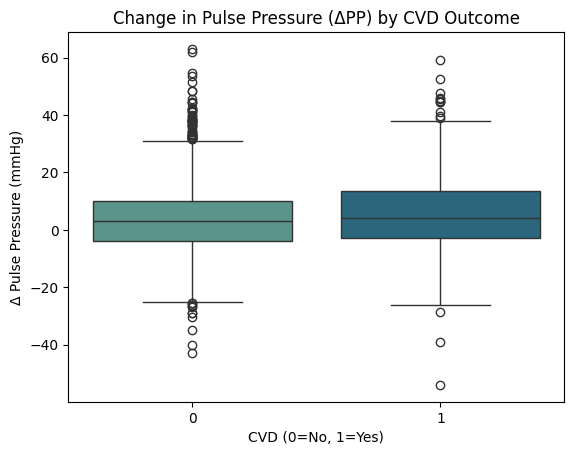

In [ ]:
sns.boxplot(data=analytic, x='CVD', y='DELTA_PP', palette='crest')
plt.title('Change in Pulse Pressure (ΔPP) by CVD Outcome')
plt.xlabel('CVD (0=No, 1=Yes)')
plt.ylabel('Δ Pulse Pressure (mmHg)')
plt.show()

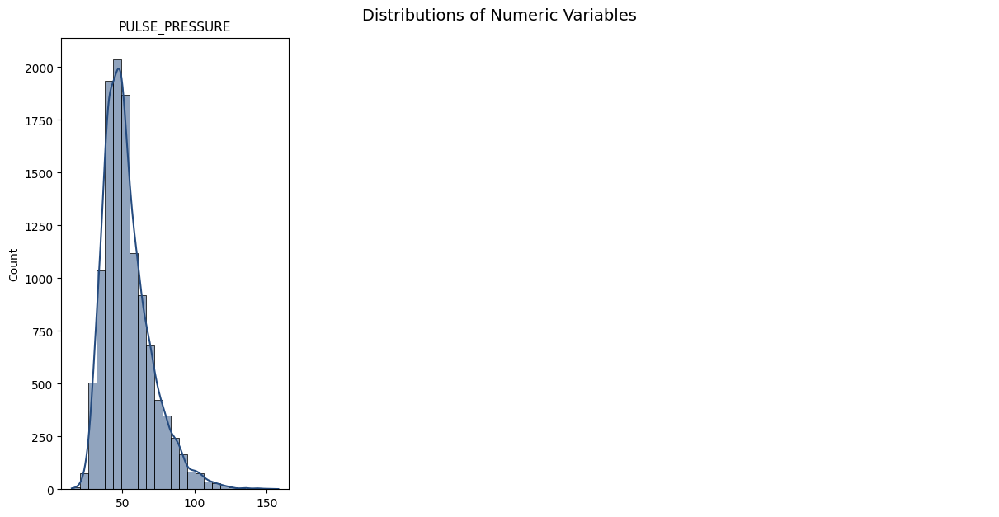

/tmp/ipython-input-3592032032.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


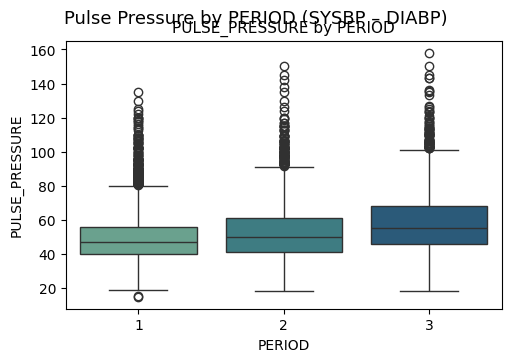

/tmp/ipython-input-1980763998.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


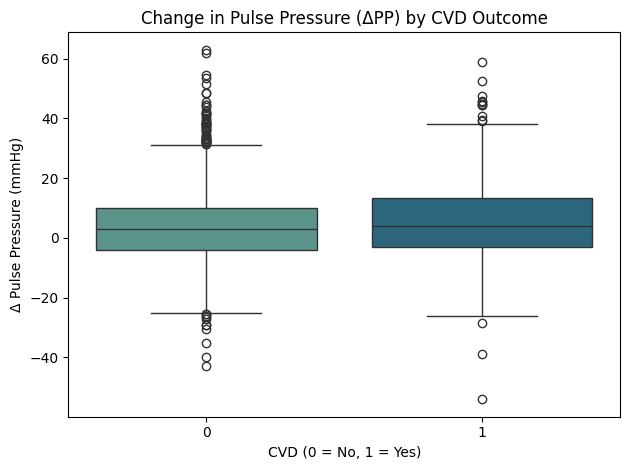

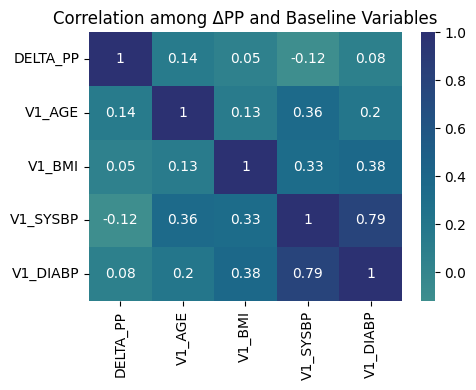

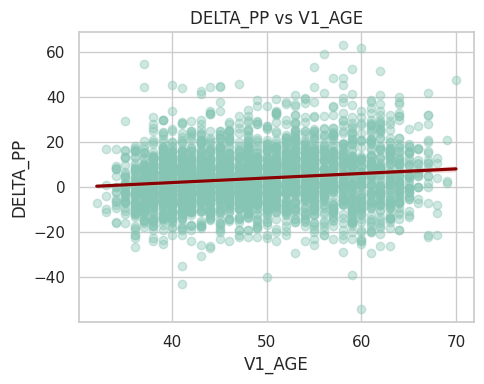

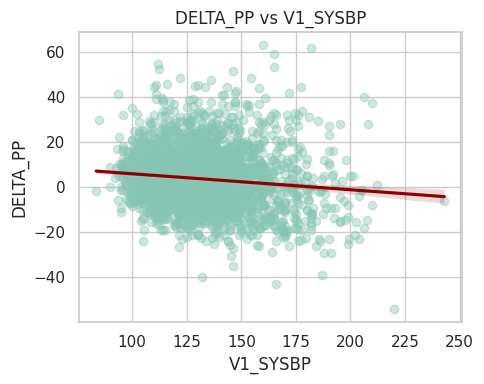

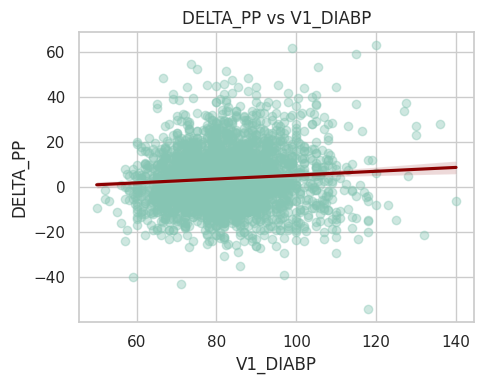

In [ ]:
# @title Pulse Pressure and ΔPP overview

# Distribution of Pulse Pressure (overall)
plot_numeric_distributions(
    df=cvd_features,
    cols=['PULSE_PRESSURE'],
    kde=True,
    stratify_by=None,
    palette='crest'
)

# Pulse Pressure by PERIOD (Progression over time)
plot_boxplots_by_group(
    df=cvd_features,
    columns=['PULSE_PRESSURE'],
    group_col='PERIOD',
    ncols=1,
    suptitle='Pulse Pressure by PERIOD (SYSBP – DIABP)'
)

# Change in Pulse Pressure (ΔPP) by CVD outcome
sns.boxplot(
    data=analytic, x='CVD', y='DELTA_PP', palette='crest'
)
plt.title('Change in Pulse Pressure (ΔPP) by CVD Outcome')
plt.xlabel('CVD (0 = No, 1 = Yes)')
plt.ylabel('Δ Pulse Pressure (mmHg)')
plt.tight_layout()
plt.show()

# Create a compact correlation table using your analytic dataset
corr_vars = ['DELTA_PP', 'V1_AGE', 'V1_BMI', 'V1_SYSBP', 'V1_DIABP']
corr_table = analytic[corr_vars].corr().round(2)

# Heatmap visualization
plt.figure(figsize=(5,4))
sns.heatmap(corr_table, annot=True, cmap='crest', center=0)
plt.title('Correlation among ΔPP and Baseline Variables')
plt.tight_layout()
plt.show()

# Relationship plots

pairs = [
    ('V1_AGE', 'DELTA_PP'),
    ('V1_SYSBP', 'DELTA_PP'),
    ('V1_DIABP', 'DELTA_PP'),
]

sns.set(style="whitegrid", context="notebook")

for x, y in pairs:
    plt.figure(figsize=(5,4))
    sns.regplot(
        data=analytic,
        x=x, y=y,
        scatter_kws={'alpha':0.4},
        line_kws={'color':'darkred'},
        color='#86c5b3'
    )
    plt.title(f'{y} vs {x}')
    plt.tight_layout()
    plt.show()

## **Data visualisation**

In [ ]:
# Selecting and visualizing all the rows for PERIOD 1
cvd_period_1 = cvd.loc[cvd.PERIOD == 1]
cvd_period_1
# These 4434 rows make sense, as there are 4434 unique participants

,RANDID,SEX,TOTCHOL,AGE,SYSBP,DIABP,CURSMOKE,CIGPDAY,BMI,DIABETES,...,CVD,HYPERTEN,TIMEAP,TIMEMI,TIMEMIFC,TIMECHD,TIMESTRK,TIMECVD,TIMEDTH,TIMEHYP
0,2448,1,195.0,39,106.0,70.0,0,0.0,26.97,0,...,1,0,8766,6438,6438,6438,8766,6438,8766,8766
2,6238,2,250.0,46,121.0,81.0,0,0.0,28.73,0,...,0,0,8766,8766,8766,8766,8766,8766,8766,8766
5,9428,1,245.0,48,127.5,80.0,1,20.0,25.34,0,...,0,0,8766,8766,8766,8766,8766,8766,8766,8766
7,10552,2,225.0,61,150.0,95.0,1,30.0,28.58,0,...,1,1,2956,2956,2956,2956,2089,2089,2956,0
9,11252,2,285.0,46,130.0,84.0,1,23.0,23.10,0,...,0,1,8766,8766,8766,8766,8766,8766,8766,4285
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11613,9990894,2,248.0,48,131.0,72.0,1,20.0,22.00,0,...,0,1,6433,6433,6433,6433,6433,6433,6433,2219
11616,9993179,2,210.0,44,126.5,87.0,1,15.0,19.16,0,...,0,1,6729,6729,6729,6729,6729,6729,6729,4396
11619,9995546,2,269.0,52,133.5,83.0,0,0.0,21.47,0,...,1,1,5939,8766,5209,5209,8766,5209,8766,735
11621,9998212,1,185.0,40,141.0,98.0,0,0.0,25.60,0,...,0,1,8766,8766,8766,8766,8766,8766,8766,0


In [ ]:
# Selecting all the rows for PERIOD 2
cvd_period_2 = cvd.loc[cvd.PERIOD == 2]
cvd_period_2

,RANDID,SEX,TOTCHOL,AGE,SYSBP,DIABP,CURSMOKE,CIGPDAY,BMI,DIABETES,...,CVD,HYPERTEN,TIMEAP,TIMEMI,TIMEMIFC,TIMECHD,TIMESTRK,TIMECVD,TIMEDTH,TIMEHYP
3,6238,2,260.0,52,105.0,69.5,0,0.0,29.43,0,...,0,0,8766,8766,8766,8766,8766,8766,8766,8766
6,9428,1,283.0,54,141.0,89.0,1,30.0,25.34,0,...,0,0,8766,8766,8766,8766,8766,8766,8766,8766
8,10552,2,232.0,67,183.0,109.0,1,20.0,30.18,0,...,1,1,2956,2956,2956,2956,2089,2089,2956,0
10,11252,2,343.0,51,109.0,77.0,1,30.0,23.48,0,...,0,1,8766,8766,8766,8766,8766,8766,8766,4285
13,11263,2,230.0,49,177.0,102.0,0,0.0,31.36,0,...,1,1,8766,8766,5719,5719,8766,5719,8766,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11614,9990894,2,258.0,54,145.0,89.0,1,20.0,21.64,0,...,0,1,6433,6433,6433,6433,6433,6433,6433,2219
11617,9993179,2,NaN,50,131.0,80.0,1,25.0,21.22,0,...,0,1,6729,6729,6729,6729,6729,6729,6729,4396
11620,9995546,2,265.0,58,140.0,83.0,0,0.0,22.55,0,...,1,1,5939,8766,5209,5209,8766,5209,8766,735
11622,9998212,1,173.0,46,126.0,82.0,0,0.0,19.17,0,...,0,1,8766,8766,8766,8766,8766,8766,8766,0


In [ ]:
# Selecting all the rows for PERIOD 3
cvd_period_3 = cvd.loc[cvd.PERIOD == 3]
cvd_period_3

,RANDID,SEX,TOTCHOL,AGE,SYSBP,DIABP,CURSMOKE,CIGPDAY,BMI,DIABETES,...,CVD,HYPERTEN,TIMEAP,TIMEMI,TIMEMIFC,TIMECHD,TIMESTRK,TIMECVD,TIMEDTH,TIMEHYP
1,2448,1,209.0,52,121.0,66.0,0,0.0,NaN,0,...,1,0,8766,6438,6438,6438,8766,6438,8766,8766
4,6238,2,237.0,58,108.0,66.0,0,0.0,28.50,0,...,0,0,8766,8766,8766,8766,8766,8766,8766,8766
11,11252,2,NaN,58,155.0,90.0,1,30.0,24.61,0,...,0,1,8766,8766,8766,8766,8766,8766,8766,4285
14,11263,2,220.0,55,180.0,106.0,0,0.0,31.17,1,...,1,1,8766,8766,5719,5719,8766,5719,8766,0
19,12806,2,320.0,57,110.0,46.0,1,30.0,22.02,0,...,0,1,8766,8766,8766,8766,8766,8766,8766,8679
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11612,9989287,1,NaN,63,120.0,80.0,1,50.0,17.38,0,...,0,0,7746,7746,7746,7746,7746,7746,7746,7746
11615,9990894,2,228.0,60,205.0,100.0,1,20.0,22.37,0,...,0,1,6433,6433,6433,6433,6433,6433,6433,2219
11618,9993179,2,251.0,56,145.0,92.0,1,35.0,21.97,0,...,0,1,6729,6729,6729,6729,6729,6729,6729,4396
11623,9998212,1,153.0,52,143.0,89.0,0,0.0,25.74,0,...,0,1,8766,8766,8766,8766,8766,8766,8766,0


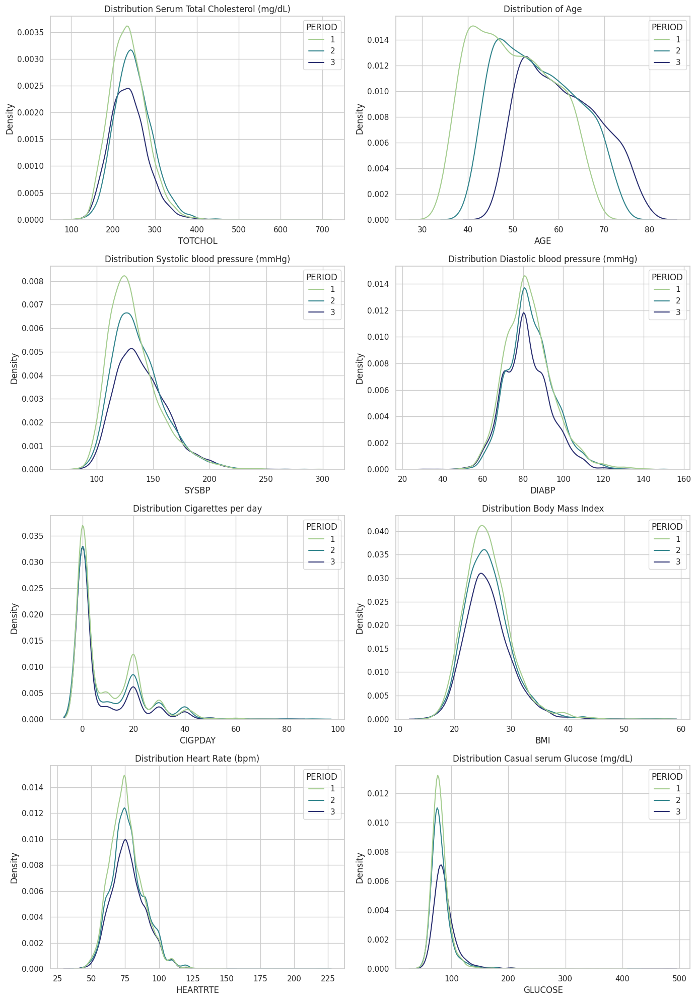

In [ ]:
# @title Distributions per period
# Function to plot 8 distributions
# We use 'data_df' here as the input DataFrame
def plot_continuous_distributions(data_df):

    # (4 rows, 2 columns)
    # 'fig' is the whole figure, 'axes' is the 4x2 array to hold each plot
    fig, axes = plt.subplots(4, 2, figsize=(14, 20))

    # Plot 1: Total Cholesterol
    # Gebruik 'data_df' (het argument) i.p.v. de hardcoded 'cvd'
    sns.kdeplot(data=data_df, x='TOTCHOL', hue='PERIOD', palette='crest', ax=axes[0, 0])
    axes[0, 0].set_title('Distribution Serum Total Cholesterol (mg/dL)')

    # Plot 2: Age
    sns.kdeplot(data=data_df, x='AGE', hue='PERIOD', palette='crest', ax=axes[0, 1])
    axes[0, 1].set_title('Distribution of Age')

    # Plot 3: Systolic bp
    sns.kdeplot(data=data_df, x='SYSBP', hue='PERIOD', palette='crest', ax=axes[1, 0])
    axes[1, 0].set_title('Distribution Systolic blood pressure (mmHg)')

    # Plot 4: Diastolic bp
    sns.kdeplot(data=data_df, x='DIABP', hue='PERIOD', palette='crest', ax=axes[1, 1])
    axes[1, 1].set_title('Distribution Diastolic blood pressure (mmHg)')

    # Plot 5: Cigarettes per day
    sns.kdeplot(data=data_df, x='CIGPDAY', hue='PERIOD', palette='crest', ax=axes[2, 0])
    axes[2, 0].set_title('Distribution Cigarettes per day')

    # Plot 6: BMI
    sns.kdeplot(data=data_df, x='BMI', hue='PERIOD', palette='crest', ax=axes[2, 1])
    axes[2, 1].set_title('Distribution Body Mass Index')

    # Plot 7: Heart Rate
    sns.kdeplot(data=data_df, x='HEARTRTE', hue='PERIOD', palette='crest', ax=axes[3, 0])
    axes[3, 0].set_title('Distribution Heart Rate (bpm)')

    # Plot 8: Glucose
    sns.kdeplot(data=data_df, x='GLUCOSE', hue='PERIOD', palette='crest', ax=axes[3, 1])
    axes[3, 1].set_title('Distribution Casual serum Glucose (mg/dL)')

    # Showing the plot
    # Axes[0, 0] is the top-left plot. axes[3, 1] is the bottom-right plot.
    plt.tight_layout()
    plt.show()

# Calling the function
plot_continuous_distributions(cvd)

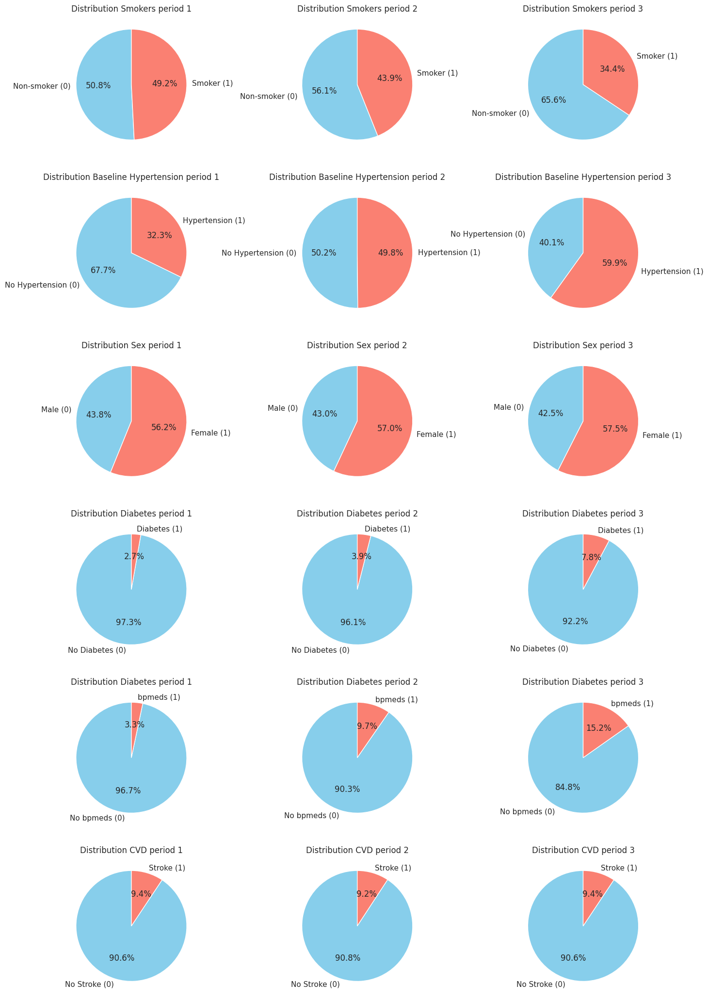

In [ ]:
# @title Piecharts of categorical variables for each period
def plot_pie_charts(cvd_period_1, cvd_period_2, cvd_period_3):

    # Figure and axes
    # 6x3 grid
    fig, axes = plt.subplots(6, 3, figsize=(14, 21))
    pie_colors = ['skyblue', 'salmon']

    # Plot 1: Distribution Smokers for each period
    cvd_period_1['CURSMOKE'].value_counts().sort_index().plot.pie(labels=['Non-smoker (0)', 'Smoker (1)'], autopct='%1.1f%%', startangle=90, colors=pie_colors,ax=axes[0, 0])
    axes[0, 0].set_title('Distribution Smokers period 1')
    axes[0, 0].set_ylabel('') # Hides the y-axis label
    cvd_period_2['CURSMOKE'].value_counts().sort_index().plot.pie(labels=['Non-smoker (0)', 'Smoker (1)'], autopct='%1.1f%%', startangle=90, colors=pie_colors,ax=axes[0, 1])
    axes[0, 1].set_title('Distribution Smokers period 2')
    axes[0, 1].set_ylabel('') # Hides the y-axis label
    cvd_period_3['CURSMOKE'].value_counts().sort_index().plot.pie(labels=['Non-smoker (0)', 'Smoker (1)'], autopct='%1.1f%%', startangle=90, colors=pie_colors,ax=axes[0, 2])
    axes[0, 2].set_title('Distribution Smokers period 3')
    axes[0, 2].set_ylabel('') # Hides the y-axis label

    # Plot 2: Distribution Baseline Hypertension
    cvd_period_1['PREVHYP'].value_counts().sort_index().plot.pie(labels=['No Hypertension (0)', 'Hypertension (1)'], autopct='%1.1f%%', startangle=90, colors=pie_colors,ax=axes[1, 0])
    axes[1, 0].set_title('Distribution Baseline Hypertension period 1')
    axes[1, 0].set_ylabel('')
    cvd_period_2['PREVHYP'].value_counts().sort_index().plot.pie(labels=['No Hypertension (0)', 'Hypertension (1)'], autopct='%1.1f%%', startangle=90, colors=pie_colors,ax=axes[1, 1])
    axes[1, 1].set_title('Distribution Baseline Hypertension period 2')
    axes[1, 1].set_ylabel('')
    cvd_period_3['PREVHYP'].value_counts().sort_index().plot.pie(labels=['No Hypertension (0)', 'Hypertension (1)'], autopct='%1.1f%%', startangle=90, colors=pie_colors,ax=axes[1, 2])
    axes[1, 2].set_title('Distribution Baseline Hypertension period 3')
    axes[1, 2].set_ylabel('')

    # Plot 3: Distribution of Sex
    cvd_period_1['SEX'].value_counts().sort_index().plot.pie(labels=['Male (0)', 'Female (1)'], autopct='%1.1f%%', startangle=90, colors=pie_colors,ax=axes[2, 0])
    axes[2, 0].set_title('Distribution Sex period 1')
    axes[2, 0].set_ylabel('')
    cvd_period_2['SEX'].value_counts().sort_index().plot.pie(labels=['Male (0)', 'Female (1)'], autopct='%1.1f%%', startangle=90, colors=pie_colors,ax=axes[2, 1])
    axes[2, 1].set_title('Distribution Sex period 2')
    axes[2, 1].set_ylabel('')
    cvd_period_3['SEX'].value_counts().sort_index().plot.pie(labels=['Male (0)', 'Female (1)'], autopct='%1.1f%%', startangle=90, colors=pie_colors,ax=axes[2, 2])
    axes[2, 2].set_title('Distribution Sex period 3')
    axes[2, 2].set_ylabel('')

    # Plot 4: Distribution Diabetes
    cvd_period_1['DIABETES'].value_counts().sort_index().plot.pie(labels=['No Diabetes (0)', 'Diabetes (1)'], autopct='%1.1f%%', startangle=90, colors=pie_colors,ax=axes[3, 0])
    axes[3, 0].set_title('Distribution Diabetes period 1')
    axes[3, 0].set_ylabel('')
    cvd_period_2['DIABETES'].value_counts().sort_index().plot.pie(labels=['No Diabetes (0)', 'Diabetes (1)'], autopct='%1.1f%%', startangle=90, colors=pie_colors,ax=axes[3, 1])
    axes[3, 1].set_title('Distribution Diabetes period 2')
    axes[3, 1].set_ylabel('')
    cvd_period_3['DIABETES'].value_counts().sort_index().plot.pie(labels=['No Diabetes (0)', 'Diabetes (1)'], autopct='%1.1f%%', startangle=90, colors=pie_colors,ax=axes[3, 2])
    axes[3, 2].set_title('Distribution Diabetes period 3')
    axes[3, 2].set_ylabel('')

    # Plot 5: Distribution BPMEDS
    cvd_period_1['BPMEDS'].value_counts().sort_index().plot.pie(labels=['No bpmeds (0)', 'bpmeds (1)'], autopct='%1.1f%%', startangle=90, colors=pie_colors,ax=axes[4, 0])
    axes[4, 0].set_title('Distribution Diabetes period 1') # Copy-paste error
    axes[4, 0].set_ylabel('')
    cvd_period_2['BPMEDS'].value_counts().sort_index().plot.pie(labels=['No bpmeds (0)', 'bpmeds (1)'], autopct='%1.1f%%', startangle=90, colors=pie_colors,ax=axes[4, 1])
    axes[4, 1].set_title('Distribution Diabetes period 2') # Copy-paste error
    axes[4, 1].set_ylabel('')
    cvd_period_3['BPMEDS'].value_counts().sort_index().plot.pie(labels=['No bpmeds (0)', 'bpmeds (1)'], autopct='%1.1f%%', startangle=90, colors=pie_colors,ax=axes[4, 2])
    axes[4, 2].set_title('Distribution Diabetes period 3') # Copy-paste error
    axes[4, 2].set_ylabel('')

    # Plot 6: Distribution STROKE
    cvd_period_1['STROKE'].value_counts().sort_index().plot.pie(labels=['No Stroke (0)', 'Stroke (1)'], autopct='%1.1f%%', startangle=90, colors=pie_colors,ax=axes[5, 0])
    axes[5, 0].set_title('Distribution CVD period 1') # Copy-paste error
    axes[5, 0].set_ylabel('')
    cvd_period_2['STROKE'].value_counts().sort_index().plot.pie(labels=['No Stroke (0)', 'Stroke (1)'], autopct='%1.1f%%', startangle=90, colors=pie_colors,ax=axes[5, 1])
    axes[5, 1].set_title('Distribution CVD period 2') # Copy-paste error
    axes[5, 1].set_ylabel('')
    cvd_period_1['STROKE'].value_counts().sort_index().plot.pie(labels=['No Stroke (0)', 'Stroke (1)'], autopct='%1.1f%%', startangle=90, colors=pie_colors,ax=axes[5, 2]) # Wrong data (p1)
    axes[5, 2].set_title('Distribution CVD period 3') # Copy-paste error
    axes[5, 2].set_ylabel('')

    # Show the figures
    plt.tight_layout() # So the figures don't overlap
    plt.show()

# Calling the function
plot_pie_charts(cvd_period_1, cvd_period_2, cvd_period_3)


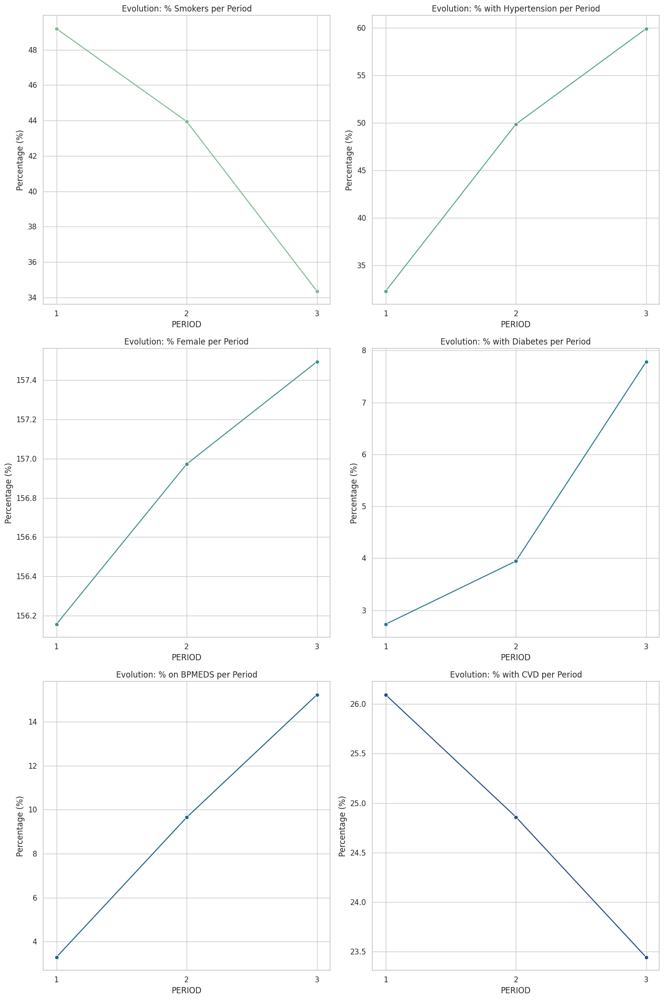

In [ ]:
# @title Line charts
def plot_evolution_per_period(data_df):

    # Calculating the percentage (mean * 100) for each variable, per period
    # We use 'data_df' here as the input DataFrame
    period_data = data_df.groupby('PERIOD')[['CURSMOKE', 'PREVHYP', 'SEX', 'DIABETES', 'BPMEDS', 'CVD']].mean() * 100

    # 6 variables, so chose a 3x2 grid
    fig, axes = plt.subplots(3, 2, figsize=(14, 21))

    # 6 colors from the 'crest' palette
    line_colors = sns.color_palette("crest", 6)

    # Lineplots
    # Plot 1: Smokers
    sns.lineplot(data=period_data, x=period_data.index, y='CURSMOKE', ax=axes[0, 0], color=line_colors[0], marker='o')
    axes[0, 0].set_title('Evolution: % Smokers per Period')
    axes[0, 0].set_ylabel('Percentage (%)')
    axes[0, 0].set_xticks([1, 2, 3]) # Ensures x-axis is 1, 2, 3

    # Plot 2: Hypertension
    sns.lineplot(data=period_data, x=period_data.index, y='PREVHYP', ax=axes[0, 1], color=line_colors[1], marker='o')
    axes[0, 1].set_title('Evolution: % with Hypertension per Period')
    axes[0, 1].set_ylabel('Percentage (%)')
    axes[0, 1].set_xticks([1, 2, 3])

    # Plot 3: Sex (no added value)
    sns.lineplot(data=period_data, x=period_data.index, y='SEX', ax=axes[1, 0], color=line_colors[2], marker='o')
    axes[1, 0].set_title('Evolution: % Female per Period')
    axes[1, 0].set_ylabel('Percentage (%)')
    axes[1, 0].set_xticks([1, 2, 3])

    # Plot 4: Diabetes
    sns.lineplot(data=period_data, x=period_data.index, y='DIABETES', ax=axes[1, 1], color=line_colors[3], marker='o')
    axes[1, 1].set_title('Evolution: % with Diabetes per Period')
    axes[1, 1].set_ylabel('Percentage (%)')
    axes[1, 1].set_xticks([1, 2, 3])

    # Plot 5: BPMEDS
    sns.lineplot(data=period_data, x=period_data.index, y='BPMEDS', ax=axes[2, 0], color=line_colors[4], marker='o')
    axes[2, 0].set_title('Evolution: % on BPMEDS per Period')
    axes[2, 0].set_ylabel('Percentage (%)')
    axes[2, 0].set_xticks([1, 2, 3])

    # Plot 6: CVD
    sns.lineplot(data=period_data, x=period_data.index, y='CVD', ax=axes[2, 1], color=line_colors[5], marker='o')
    axes[2, 1].set_title('Evolution: % with CVD per Period')
    axes[2, 1].set_ylabel('Percentage (%)')
    axes[2, 1].set_xticks([1, 2, 3])

    # Showing the figures
    plt.tight_layout()
    plt.show()

# Calling the function
plot_evolution_per_period(cvd)

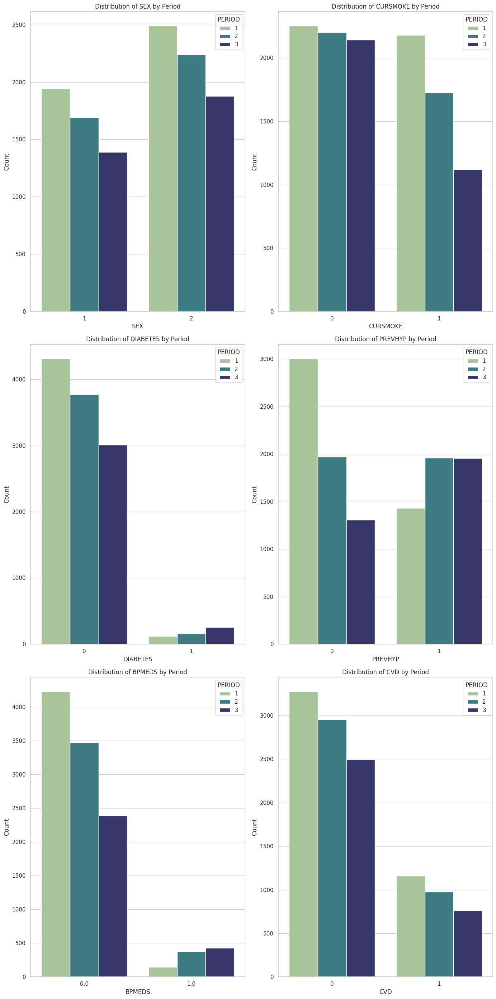

In [ ]:
# @title Bar charts
# Function to plot the categorical distribution per period in bar charts
# We use 'data_df' here as the input DataFrame
def plot_categorical_counts_per_period(data_df):

    # Defining the variables to plot
    # We plot 6 variables, so a 3x2 grid
    plot_vars = ['SEX', 'CURSMOKE', 'DIABETES', 'PREVHYP', 'BPMEDS','CVD']

    # 4 rows, 2 columns. Needs to be tall.
    # (Note: your code correctly uses 3x2 for 6 plots)
    fig, axes = plt.subplots(3, 2, figsize=(14, 28))

    # flatten() turns it into a simple 1D list (axes[0], axes[1], ...)
    # This makes the loop easier.
    axes = axes.flatten()

    # Loop so it plots on each axis
    for i, var in enumerate(plot_vars):
        ax = axes[i]  # Get the current axis (e.g., axes[0], then axes[1])

        # Countplot on that specific axis
        # hue='PERIOD' automatically splits the bars by period
        # We use 'data_df' here as the input DataFrame
        sns.countplot(data=data_df, x=var, hue='PERIOD', palette='crest', ax=ax)

        ax.set_title(f'Distribution of {var} by Period')
        ax.set_xlabel(var)
        ax.set_ylabel('Count')

    # Showing the figures
    plt.tight_layout()
    plt.show()

# Calling the function
plot_categorical_counts_per_period(cvd)

## **Machine Learning**

X, y = analytic[['DELTA_PP', 'V1_AGE', 'V1_SEX', 'V1_BMI', 'V1_SYSBP', 'V1_DIABP', 'V1_GLUCOSE', 'V1_TOTCHOL', 'V1_CIGPDAY']], analytic['CVD']
X

In [ ]:
# machine learning functions
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import classification_report
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.linear_model import LogisticRegression

In [ ]:
#@title Train test split
mldataset = analytic
X, y = mldataset[['DELTA_PP', 'V1_SEX']], mldataset['CVD']
X

,DELTA_PP,V1_SEX
0,-4.5,1
1,-14.0,1
2,5.0,1
3,8.0,1
4,-10.5,0
...,...,...
3201,0.5,0
3202,-3.0,1
3203,11.5,1
3204,1.0,0


In [ ]:
train_X, test_X, train_y, test_y = train_test_split(X, y,
                                                    test_size=0.2, #  proportion of data to use as testing data
                                                    stratify=y, # keep y distribution similar to original
                                                    random_state=42) # make sure we get the same 'random' results each time

In [ ]:
print("train_X: ", train_X.shape)
print("train_y: ", train_y.shape)
print("test_X: ", test_X.shape)
print("test_y: ", test_y.shape)

train_X:  (2564, 2)
train_y:  (2564,)
test_X:  (642, 2)
test_y:  (642,)


In [ ]:
test_y

,CVD
557,1
1640,0
2971,0
2800,1
392,0
...,...
1174,1
2505,0
2995,0
1731,1


In [ ]:
y.value_counts()

,count
CVD,
0,2459
1,747


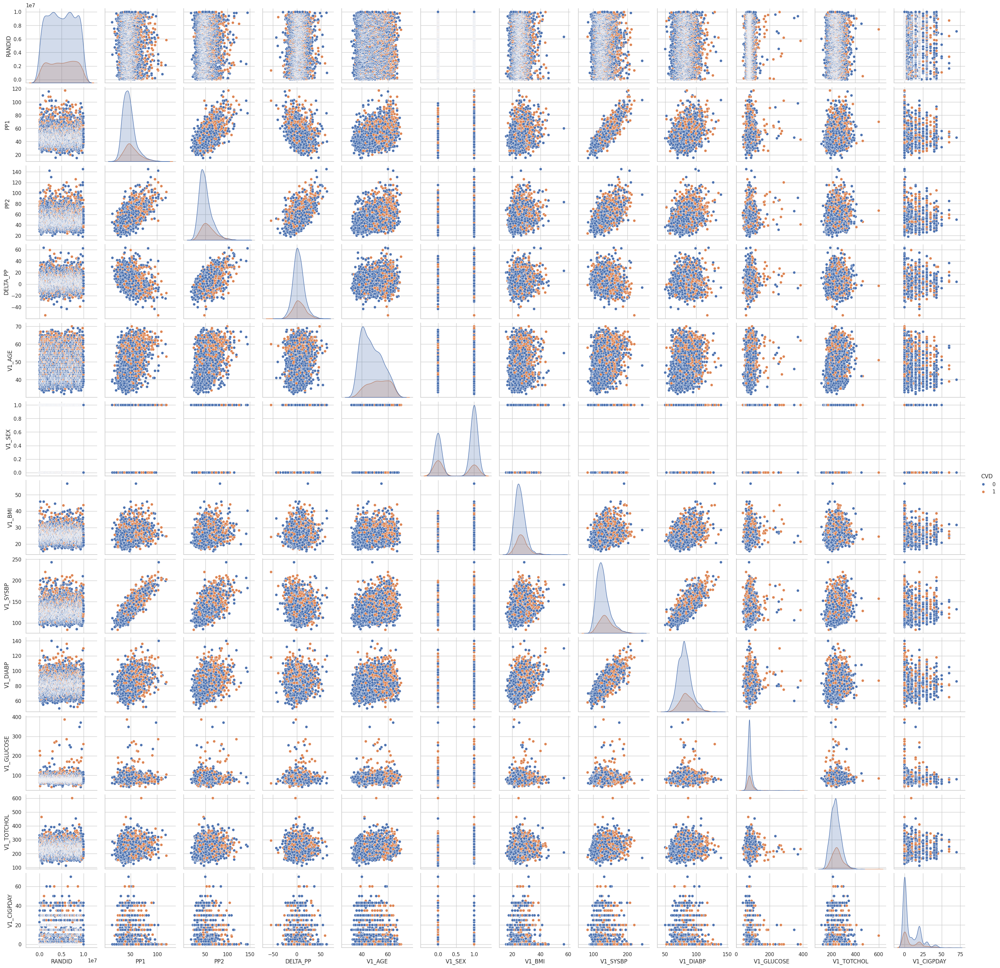

In [ ]:
sns.pairplot(mldataset, hue='CVD');

In [ ]:
#@title Decision tree classifier
# defining decision tree classifier
clf = tree.DecisionTreeClassifier(random_state=42)
# train classifier
clf = clf.fit(train_X, train_y) # train data on training data and training target (the 147 rows)

# we use clf = clf.fit etc in order to save the changes to the clf object in memory.

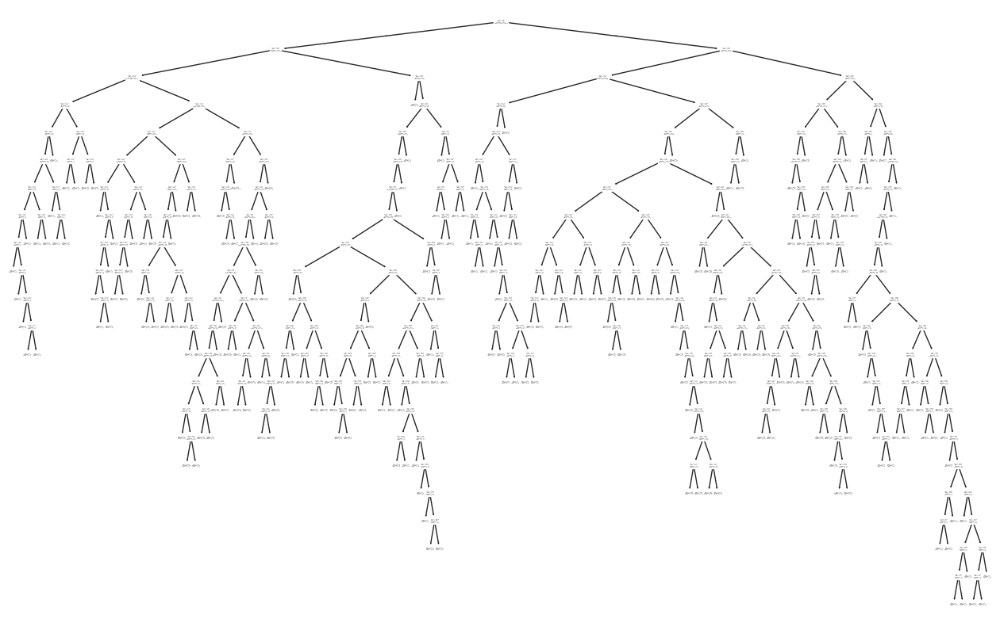

In [ ]:
plt.figure(figsize=(16,10)) # make the figure dimensions bigger
tree.plot_tree(clf); # plot_tree() method from the tree module in sklearn

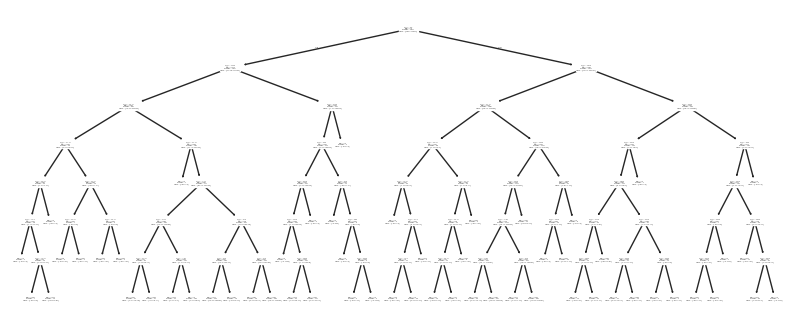

In [ ]:
# Use class_weight='balanced' to handle class imbalance
clf = tree.DecisionTreeClassifier(random_state=1, max_depth=7, class_weight='balanced')

# Step 3: Train the classifier
clf = clf.fit(train_X, train_y)

# visualize the tree
fig, ax = plt.subplots(figsize=(10,4))
tree.plot_tree(clf, ax=ax);

In [ ]:
prediction = clf.predict(test_X) #  assign test dataset (test_X) as input

In [ ]:
# print and compare (this is not scalable obviously)
print("Original Labels", test_y.values)
print("Labels Predicted", prediction)

Original Labels [1 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0
 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1
 0 0 1 1 0 0 0 0 0 1 1 0 0 1 0 0 0 0 0 0 0 0 0 1 1 1 1 0 0 1 1 0 0 0 0 0 0
 1 0 1 0 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 1 0 0 1 0 0 0 1
 1 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0 0 0 0 0 1
 0 0 0 0 0 0 1 0 0 1 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 1 1 0 0
 1 1 0 0 0 1 0 0 0 1 0 1 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0
 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0 1 0 0 0 0 0 1 0 0 1 0 0
 0 0 1 0 0 0 0 0 1 1 1 1 1 1 0 0 0 0 1 0 0 0 0 0 1 1 0 1 0 0 0 0 0 0 0 0 1
 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 1
 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 1 0 0 0
 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0
 0 0 0 0 

In [ ]:
# @title Evaluation metrics Decision tree
print('Accuracy: ', accuracy_score(y_true=test_y, y_pred=prediction))

Accuracy:  0.6105919003115264


In [ ]:
print(classification_report(y_true=test_y, y_pred=prediction))

              precision    recall  f1-score   support

           0       0.84      0.60      0.70       492
           1       0.33      0.63      0.43       150

    accuracy                           0.61       642
   macro avg       0.59      0.62      0.57       642
weighted avg       0.72      0.61      0.64       642



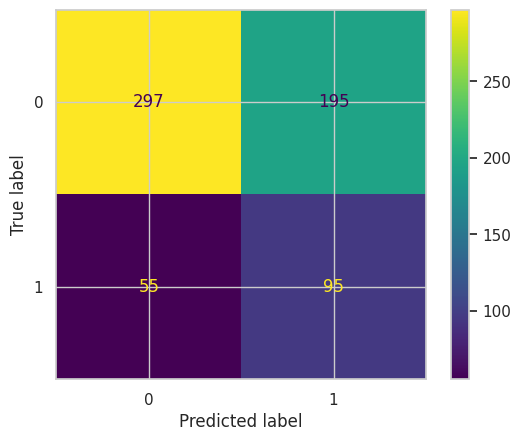

In [ ]:
cm = confusion_matrix(y_true=test_y,
                 y_pred=prediction)

disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=clf.classes_) # be mindful of the silly underscore behind classes!

disp.plot();

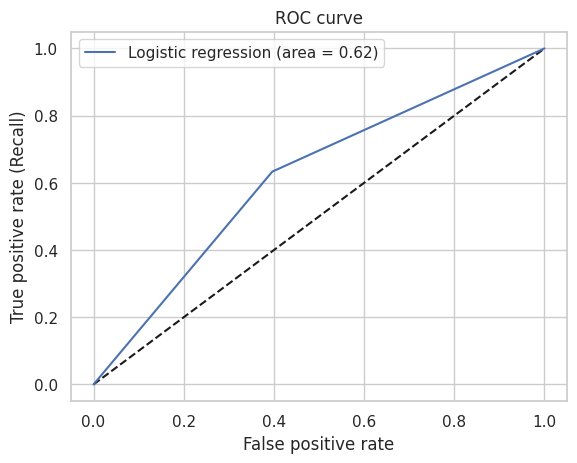

In [ ]:
fpr_clf, tpr_clf, thresholds_clf = roc_curve(test_y, prediction)
auc_clf = auc(fpr_clf, tpr_clf)
fig, ax = plt.subplots()

ax.plot([0, 1], [0, 1], 'k--')
ax.plot(fpr_clf, tpr_clf, label='Logistic regression (area = {:.2f})'.format(auc_clf))
ax.set(xlabel='False positive rate',
       ylabel='True positive rate (Recall)',
       title='ROC curve')
ax.legend(loc='best');

accuracy score:  0.6174636174636174


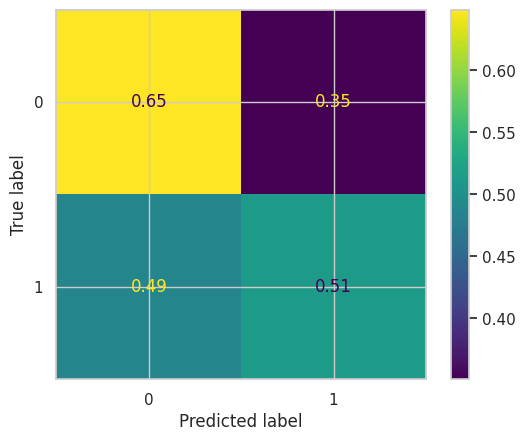

In [ ]:
#@title Random Forest classifer
# Step 1: we use the same train-test split as above
train_X, test_X, train_y, test_y = train_test_split(X, y, test_size=0.3, stratify=y, random_state=1)

# Step 2: Pick the algorithm
clfRF = RandomForestClassifier(max_depth=7, random_state=0, class_weight='balanced')

# Step 3: Train the classifier
clfRF.fit(train_X, train_y)

# Step 4: Make a prediction
predictionRF = clfRF.predict(test_X)

# Step 5: Evaluate the prediction
print('accuracy score: ', accuracy_score(y_true=test_y, y_pred=predictionRF))

cm = confusion_matrix(y_true=test_y,
                 y_pred=predictionRF,
                 normalize='true')

disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=clfRF.classes_)

disp.plot();

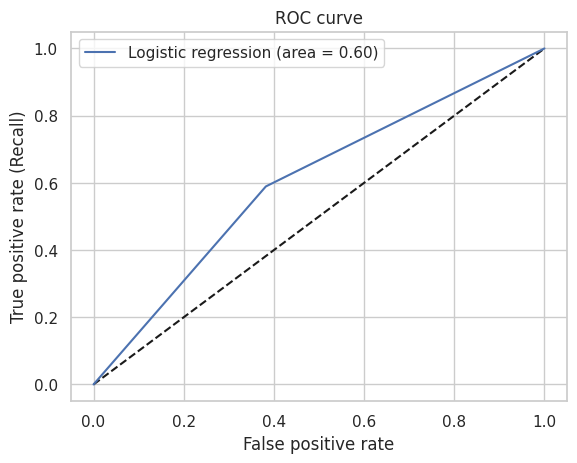

In [ ]:
fpr_clfRF, tpr_clfRF, thresholds_clfRF = roc_curve(test_y, prediction)
auc_clfRF = auc(fpr_clfRF, tpr_clfRF)
fig, ax = plt.subplots()

ax.plot([0, 1], [0, 1], 'k--')
ax.plot(fpr_clfRF, tpr_clfRF, label='Logistic regression (area = {:.2f})'.format(auc_clfRF))
ax.set(xlabel='False positive rate',
       ylabel='True positive rate (Recall)',
       title='ROC curve')
ax.legend(loc='best');

0.6112266112266113


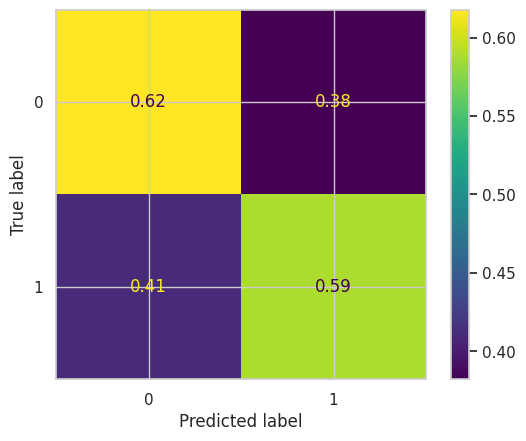

In [ ]:
#@title Logistic regression
# Step 1: we use the same train-test split as above
train_X, test_X, train_y, test_y = train_test_split(X, y, test_size=0.3, stratify=y, random_state=1)

# Step 2: Pick the algorithm
logreg = LogisticRegression(max_iter=1000, class_weight='balanced')

# Step 3: Train the classifier
logreg = logreg.fit(train_X, train_y)

# Step 4: Make a prediction
prediction = logreg.predict(test_X)
y_prob_logreg = logreg.predict_proba(test_X)[:,1]

# Step 5: Evaluate the prediction
print(accuracy_score(y_true=test_y, y_pred=prediction))

cm = confusion_matrix(y_true=test_y,
                 y_pred=prediction,
                 normalize='true')

disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=logreg.classes_)

disp.plot();



In [ ]:
fpr_logreg, tpr_logreg, thresholds_logreg = roc_curve(test_y, y_prob_logreg)

In [ ]:
auc_logreg = auc(fpr_logreg, tpr_logreg)

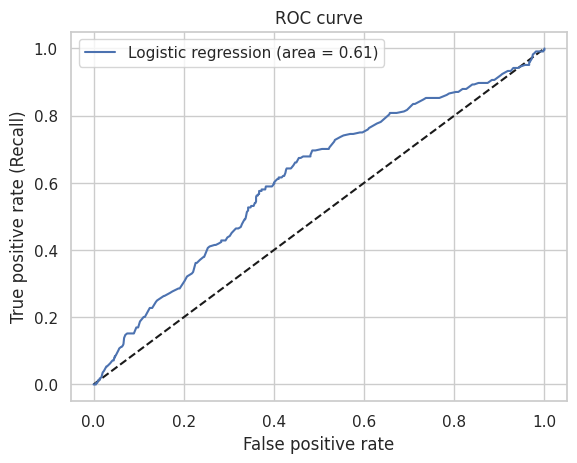

In [ ]:
fig, ax = plt.subplots()
ax.plot([0, 1], [0, 1], 'k--')
ax.plot(fpr_logreg, tpr_logreg, label='Logistic regression (area = {:.2f})'.format(auc_logreg))
ax.set(xlabel='False positive rate',
       ylabel='True positive rate (Recall)',
       title='ROC curve')
ax.legend(loc='best');

0.7120582120582121


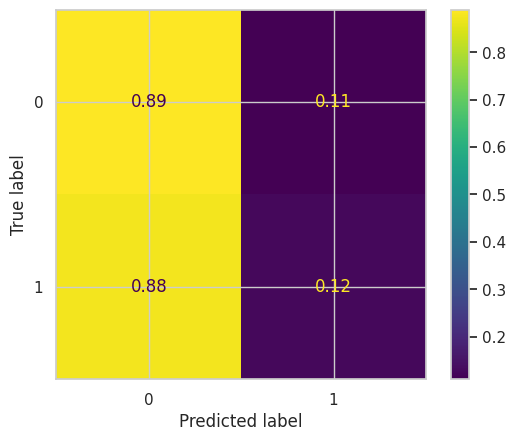

In [ ]:
#@title KNN classifier
# Step 1: we use the same train-test split as above
train_X, test_X, train_y, test_y = train_test_split(X, y, test_size=0.3, stratify=y, random_state=1)

# Step 2: Pick the algorithm
# TODO: HOW DO WE DEFINE THE CLASSIFIER?
clfKNN = KNeighborsClassifier(n_neighbors=5)

# Step 3: Train the classifier
clfKNN = clfKNN.fit(train_X, train_y)

# Step 4: Make a prediction
predictionKNN_proba = clfKNN.predict_proba(test_X)[:,1]
predictionKNN = clfKNN.predict(test_X) # Get binary predictions for evaluation metrics


# Step 5: Evaluate the prediction
print(accuracy_score(y_true=test_y, y_pred=predictionKNN))

cm = confusion_matrix(y_true=test_y,
                 y_pred=predictionKNN,
                 normalize='true')

disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=clfKNN.classes_)

disp.plot();

In [ ]:
fpr_clfKNN, tpr_clfKNN, thresholds_clf = roc_curve(test_y, predictionKNN_proba)

In [ ]:
auc_clfKNN = auc(fpr_clfKNN, tpr_clfKNN)

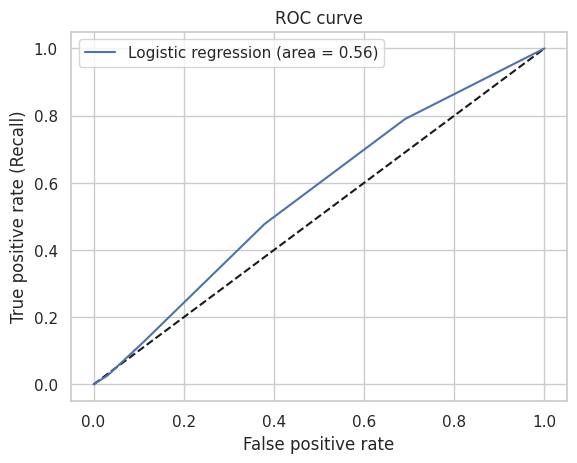

In [ ]:
fig, ax = plt.subplots()
ax.plot([0, 1], [0, 1], 'k--')
ax.plot(fpr_clfKNN, tpr_clfKNN, label='Logistic regression (area = {:.2f})'.format(auc_clfKNN))
ax.set(xlabel='False positive rate',
       ylabel='True positive rate (Recall)',
       title='ROC curve')
ax.legend(loc='best');